# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:20<00:00, 2.93KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

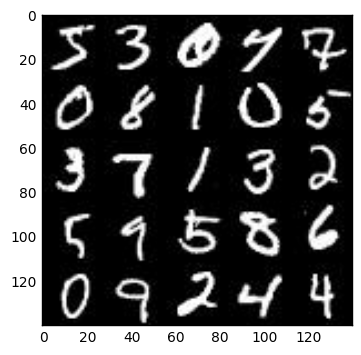

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

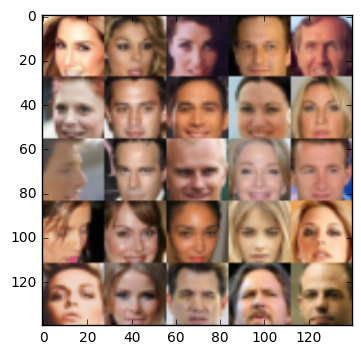

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/Users/Kenny/anaconda/envs/dlnd-tf-lab/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [82]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32)
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [83]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
        
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x1 or 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [84]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [85]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return g_loss, d_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [86]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)    
        
    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [87]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [90]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, _ = model_inputs(data_shape[1], 
                                               data_shape[2], 
                                               data_shape[3], 
                                               z_dim)
    g_loss, d_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    i = 0
    print_every=10
    show_every=100
    samples, losses = [], []

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                i += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                if i % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z, input_real: batch_images})
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if i % show_every == 0:                    
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.9740... Generator Loss: 0.6840
Epoch 1/2... Discriminator Loss: 1.1947... Generator Loss: 0.6020
Epoch 1/2... Discriminator Loss: 1.0069... Generator Loss: 0.8919
Epoch 1/2... Discriminator Loss: 1.0509... Generator Loss: 1.4740
Epoch 1/2... Discriminator Loss: 1.1117... Generator Loss: 0.6651
Epoch 1/2... Discriminator Loss: 1.3689... Generator Loss: 0.3752
Epoch 1/2... Discriminator Loss: 1.3525... Generator Loss: 0.5047
Epoch 1/2... Discriminator Loss: 0.7591... Generator Loss: 1.7156
Epoch 1/2... Discriminator Loss: 0.9775... Generator Loss: 1.1326
Epoch 1/2... Discriminator Loss: 0.8994... Generator Loss: 1.8913


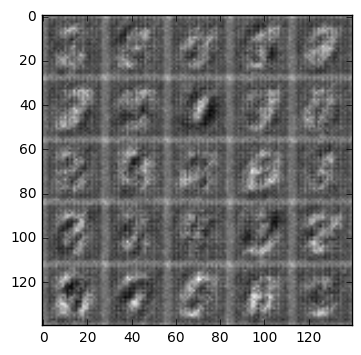

Epoch 1/2... Discriminator Loss: 1.4582... Generator Loss: 0.3198
Epoch 1/2... Discriminator Loss: 0.6071... Generator Loss: 1.1559
Epoch 1/2... Discriminator Loss: 0.5640... Generator Loss: 1.5879
Epoch 1/2... Discriminator Loss: 1.3080... Generator Loss: 0.3748
Epoch 1/2... Discriminator Loss: 0.6069... Generator Loss: 0.9751
Epoch 1/2... Discriminator Loss: 0.4330... Generator Loss: 1.4125
Epoch 1/2... Discriminator Loss: 0.2218... Generator Loss: 2.5463
Epoch 1/2... Discriminator Loss: 0.2212... Generator Loss: 2.0330
Epoch 1/2... Discriminator Loss: 0.1776... Generator Loss: 2.4386
Epoch 1/2... Discriminator Loss: 0.2642... Generator Loss: 1.7583


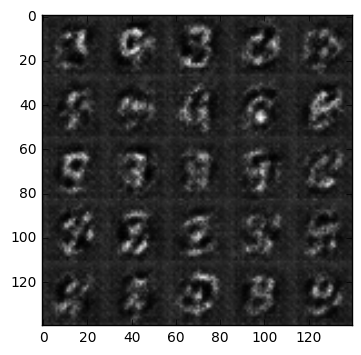

Epoch 1/2... Discriminator Loss: 0.8264... Generator Loss: 0.7530
Epoch 1/2... Discriminator Loss: 0.2868... Generator Loss: 1.7243
Epoch 1/2... Discriminator Loss: 0.1335... Generator Loss: 2.4505
Epoch 1/2... Discriminator Loss: 0.8108... Generator Loss: 4.1695
Epoch 1/2... Discriminator Loss: 0.2589... Generator Loss: 2.0463
Epoch 1/2... Discriminator Loss: 0.1131... Generator Loss: 3.1044
Epoch 1/2... Discriminator Loss: 0.0684... Generator Loss: 3.9163
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.4632
Epoch 1/2... Discriminator Loss: 1.4876... Generator Loss: 0.3171
Epoch 1/2... Discriminator Loss: 2.7587... Generator Loss: 0.1178


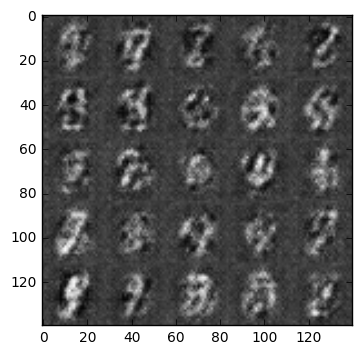

Epoch 1/2... Discriminator Loss: 0.1470... Generator Loss: 3.2925
Epoch 1/2... Discriminator Loss: 0.6298... Generator Loss: 1.1789
Epoch 1/2... Discriminator Loss: 0.4642... Generator Loss: 3.2258
Epoch 1/2... Discriminator Loss: 0.2348... Generator Loss: 2.5050
Epoch 1/2... Discriminator Loss: 0.4215... Generator Loss: 1.4363
Epoch 1/2... Discriminator Loss: 0.1595... Generator Loss: 3.1145
Epoch 1/2... Discriminator Loss: 0.3362... Generator Loss: 2.7276
Epoch 1/2... Discriminator Loss: 0.1339... Generator Loss: 2.7964
Epoch 1/2... Discriminator Loss: 0.1050... Generator Loss: 3.1501
Epoch 1/2... Discriminator Loss: 0.1531... Generator Loss: 2.5530


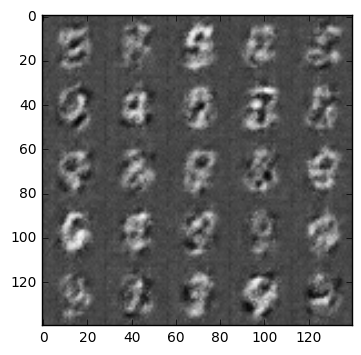

Epoch 1/2... Discriminator Loss: 0.2534... Generator Loss: 3.4626
Epoch 1/2... Discriminator Loss: 0.1998... Generator Loss: 2.5015
Epoch 1/2... Discriminator Loss: 0.5286... Generator Loss: 1.2751
Epoch 1/2... Discriminator Loss: 0.3467... Generator Loss: 1.6726
Epoch 1/2... Discriminator Loss: 0.1109... Generator Loss: 2.8474
Epoch 1/2... Discriminator Loss: 0.6155... Generator Loss: 4.4776
Epoch 1/2... Discriminator Loss: 0.1141... Generator Loss: 3.1172
Epoch 1/2... Discriminator Loss: 1.2958... Generator Loss: 5.7187
Epoch 1/2... Discriminator Loss: 0.2459... Generator Loss: 2.1133
Epoch 1/2... Discriminator Loss: 0.1875... Generator Loss: 2.4495


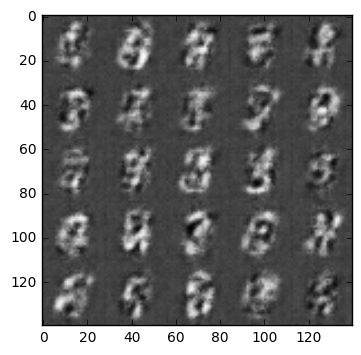

Epoch 1/2... Discriminator Loss: 0.2692... Generator Loss: 1.8477
Epoch 1/2... Discriminator Loss: 0.1473... Generator Loss: 2.6667
Epoch 1/2... Discriminator Loss: 0.2022... Generator Loss: 2.2256
Epoch 1/2... Discriminator Loss: 0.0824... Generator Loss: 3.6880
Epoch 1/2... Discriminator Loss: 0.1051... Generator Loss: 3.1135
Epoch 1/2... Discriminator Loss: 0.1673... Generator Loss: 2.4928
Epoch 1/2... Discriminator Loss: 0.1463... Generator Loss: 3.2589
Epoch 1/2... Discriminator Loss: 0.1463... Generator Loss: 2.5373
Epoch 1/2... Discriminator Loss: 0.2453... Generator Loss: 3.9951
Epoch 1/2... Discriminator Loss: 0.1230... Generator Loss: 2.7079


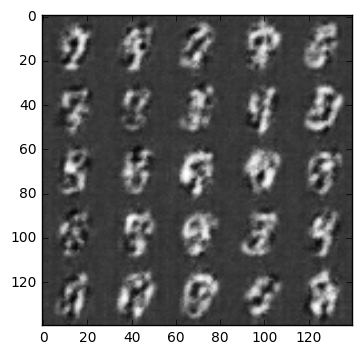

Epoch 1/2... Discriminator Loss: 0.1358... Generator Loss: 2.7519
Epoch 1/2... Discriminator Loss: 0.2116... Generator Loss: 2.0095
Epoch 1/2... Discriminator Loss: 0.0811... Generator Loss: 3.3518
Epoch 1/2... Discriminator Loss: 0.1413... Generator Loss: 3.1824
Epoch 1/2... Discriminator Loss: 0.1959... Generator Loss: 3.6655
Epoch 1/2... Discriminator Loss: 0.1559... Generator Loss: 3.2063
Epoch 1/2... Discriminator Loss: 0.1565... Generator Loss: 3.4635
Epoch 1/2... Discriminator Loss: 0.2217... Generator Loss: 2.1194
Epoch 1/2... Discriminator Loss: 0.1151... Generator Loss: 2.9256
Epoch 1/2... Discriminator Loss: 0.0731... Generator Loss: 3.5587


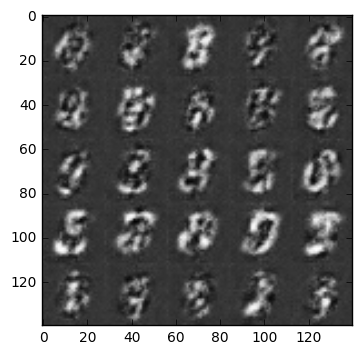

Epoch 1/2... Discriminator Loss: 0.2466... Generator Loss: 1.9702
Epoch 1/2... Discriminator Loss: 0.2955... Generator Loss: 1.7057
Epoch 1/2... Discriminator Loss: 0.0979... Generator Loss: 3.0210
Epoch 1/2... Discriminator Loss: 0.0956... Generator Loss: 2.9932
Epoch 1/2... Discriminator Loss: 0.1856... Generator Loss: 2.2308
Epoch 1/2... Discriminator Loss: 0.0550... Generator Loss: 3.6019
Epoch 1/2... Discriminator Loss: 0.2186... Generator Loss: 2.0856
Epoch 1/2... Discriminator Loss: 0.1869... Generator Loss: 4.0618
Epoch 1/2... Discriminator Loss: 0.1534... Generator Loss: 2.4866
Epoch 1/2... Discriminator Loss: 0.2723... Generator Loss: 1.7876


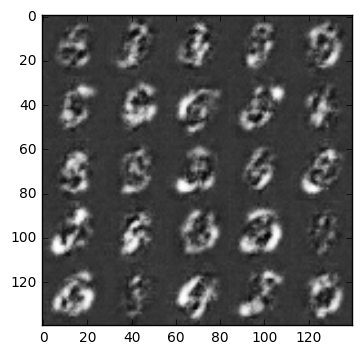

Epoch 1/2... Discriminator Loss: 0.0917... Generator Loss: 3.5338
Epoch 1/2... Discriminator Loss: 0.1682... Generator Loss: 2.4031
Epoch 1/2... Discriminator Loss: 0.0879... Generator Loss: 2.9492
Epoch 1/2... Discriminator Loss: 0.0772... Generator Loss: 3.2242
Epoch 1/2... Discriminator Loss: 0.0990... Generator Loss: 3.2367
Epoch 1/2... Discriminator Loss: 0.1616... Generator Loss: 2.2718
Epoch 1/2... Discriminator Loss: 1.0507... Generator Loss: 0.5113
Epoch 1/2... Discriminator Loss: 0.4482... Generator Loss: 1.4550
Epoch 1/2... Discriminator Loss: 0.3015... Generator Loss: 1.8793
Epoch 1/2... Discriminator Loss: 0.1615... Generator Loss: 2.6685


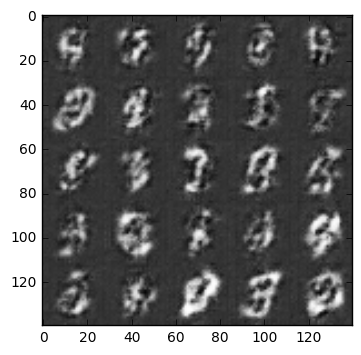

Epoch 1/2... Discriminator Loss: 0.1556... Generator Loss: 2.8556
Epoch 1/2... Discriminator Loss: 0.1267... Generator Loss: 2.6474
Epoch 1/2... Discriminator Loss: 0.1628... Generator Loss: 2.6545
Epoch 1/2... Discriminator Loss: 0.1438... Generator Loss: 2.7569
Epoch 1/2... Discriminator Loss: 0.0923... Generator Loss: 3.0738
Epoch 1/2... Discriminator Loss: 0.1123... Generator Loss: 2.7648
Epoch 1/2... Discriminator Loss: 0.2205... Generator Loss: 1.9036
Epoch 1/2... Discriminator Loss: 0.1256... Generator Loss: 2.6046
Epoch 1/2... Discriminator Loss: 0.1097... Generator Loss: 2.6936
Epoch 1/2... Discriminator Loss: 0.1268... Generator Loss: 2.5519


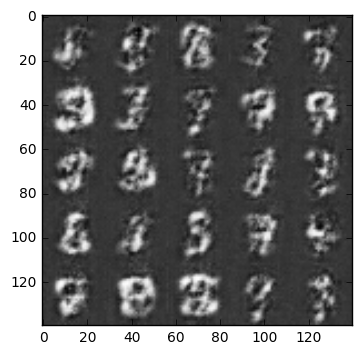

Epoch 1/2... Discriminator Loss: 0.0845... Generator Loss: 3.0697
Epoch 1/2... Discriminator Loss: 0.1209... Generator Loss: 2.7796
Epoch 1/2... Discriminator Loss: 0.0766... Generator Loss: 3.0749
Epoch 1/2... Discriminator Loss: 0.1015... Generator Loss: 2.7218
Epoch 1/2... Discriminator Loss: 0.0507... Generator Loss: 3.6411
Epoch 1/2... Discriminator Loss: 0.0758... Generator Loss: 3.3242
Epoch 1/2... Discriminator Loss: 0.0475... Generator Loss: 3.8186
Epoch 1/2... Discriminator Loss: 0.0585... Generator Loss: 3.4782
Epoch 1/2... Discriminator Loss: 0.0760... Generator Loss: 3.5561
Epoch 1/2... Discriminator Loss: 0.0765... Generator Loss: 3.2349


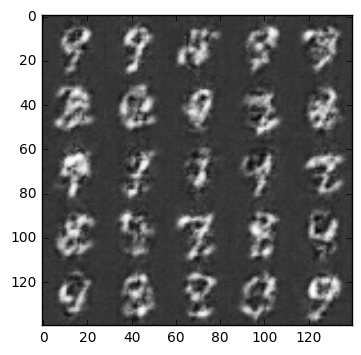

Epoch 1/2... Discriminator Loss: 0.0753... Generator Loss: 4.0050
Epoch 1/2... Discriminator Loss: 0.0879... Generator Loss: 3.2110
Epoch 1/2... Discriminator Loss: 0.0613... Generator Loss: 3.9396
Epoch 1/2... Discriminator Loss: 0.0816... Generator Loss: 3.2399
Epoch 1/2... Discriminator Loss: 0.0590... Generator Loss: 3.2013
Epoch 1/2... Discriminator Loss: 0.0454... Generator Loss: 3.7379
Epoch 1/2... Discriminator Loss: 0.0746... Generator Loss: 3.3157
Epoch 1/2... Discriminator Loss: 0.0589... Generator Loss: 3.4357
Epoch 1/2... Discriminator Loss: 0.0382... Generator Loss: 4.0905
Epoch 1/2... Discriminator Loss: 0.0277... Generator Loss: 4.5319


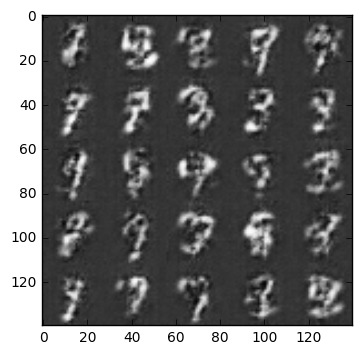

Epoch 1/2... Discriminator Loss: 0.0397... Generator Loss: 4.0137
Epoch 1/2... Discriminator Loss: 0.0540... Generator Loss: 3.9660
Epoch 1/2... Discriminator Loss: 0.0393... Generator Loss: 4.1296
Epoch 1/2... Discriminator Loss: 0.0501... Generator Loss: 3.8129
Epoch 1/2... Discriminator Loss: 0.0728... Generator Loss: 3.0699
Epoch 1/2... Discriminator Loss: 0.0315... Generator Loss: 4.1874
Epoch 1/2... Discriminator Loss: 0.0378... Generator Loss: 4.0318
Epoch 1/2... Discriminator Loss: 0.0527... Generator Loss: 3.5039
Epoch 1/2... Discriminator Loss: 0.0507... Generator Loss: 3.7574
Epoch 1/2... Discriminator Loss: 0.0247... Generator Loss: 4.6122


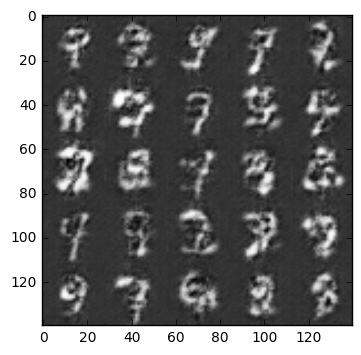

Epoch 1/2... Discriminator Loss: 0.0189... Generator Loss: 4.5571
Epoch 1/2... Discriminator Loss: 0.0457... Generator Loss: 3.8192
Epoch 1/2... Discriminator Loss: 0.5441... Generator Loss: 1.7648
Epoch 1/2... Discriminator Loss: 0.2114... Generator Loss: 2.1951
Epoch 1/2... Discriminator Loss: 0.1690... Generator Loss: 2.3543
Epoch 1/2... Discriminator Loss: 0.2236... Generator Loss: 2.3411
Epoch 1/2... Discriminator Loss: 0.0817... Generator Loss: 2.9810
Epoch 1/2... Discriminator Loss: 0.0642... Generator Loss: 3.5859
Epoch 1/2... Discriminator Loss: 0.1101... Generator Loss: 2.9489
Epoch 1/2... Discriminator Loss: 0.0731... Generator Loss: 2.9848


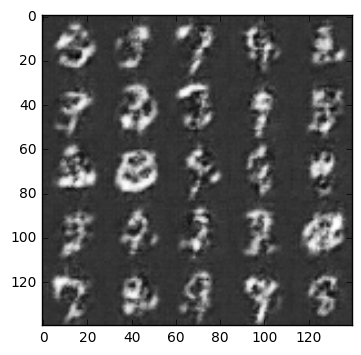

Epoch 1/2... Discriminator Loss: 0.0838... Generator Loss: 3.4416
Epoch 1/2... Discriminator Loss: 0.3481... Generator Loss: 1.4621
Epoch 1/2... Discriminator Loss: 0.1621... Generator Loss: 2.4539
Epoch 1/2... Discriminator Loss: 0.1258... Generator Loss: 2.6923
Epoch 1/2... Discriminator Loss: 0.0672... Generator Loss: 3.2260
Epoch 1/2... Discriminator Loss: 0.0685... Generator Loss: 3.2970
Epoch 1/2... Discriminator Loss: 0.0872... Generator Loss: 3.0159
Epoch 1/2... Discriminator Loss: 0.0416... Generator Loss: 3.7258
Epoch 1/2... Discriminator Loss: 0.0832... Generator Loss: 3.0571
Epoch 1/2... Discriminator Loss: 0.0548... Generator Loss: 3.5074


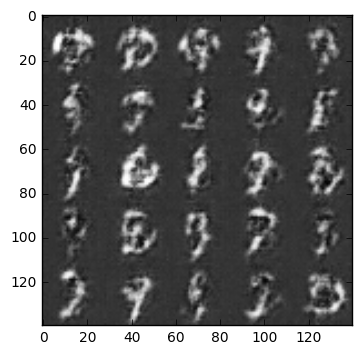

Epoch 1/2... Discriminator Loss: 0.0832... Generator Loss: 3.0290
Epoch 1/2... Discriminator Loss: 0.0486... Generator Loss: 3.5579
Epoch 1/2... Discriminator Loss: 0.0809... Generator Loss: 3.0848
Epoch 1/2... Discriminator Loss: 0.1241... Generator Loss: 2.6547
Epoch 1/2... Discriminator Loss: 0.0399... Generator Loss: 3.9445
Epoch 1/2... Discriminator Loss: 0.0905... Generator Loss: 3.1132
Epoch 1/2... Discriminator Loss: 0.1190... Generator Loss: 2.5965
Epoch 1/2... Discriminator Loss: 0.0429... Generator Loss: 3.8677
Epoch 1/2... Discriminator Loss: 0.0547... Generator Loss: 3.4168
Epoch 1/2... Discriminator Loss: 0.0733... Generator Loss: 3.1164


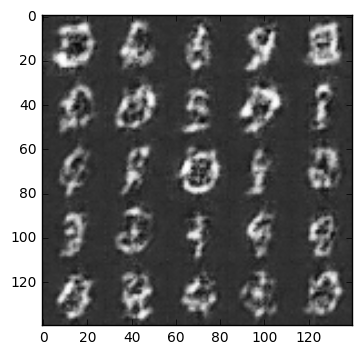

Epoch 1/2... Discriminator Loss: 0.0723... Generator Loss: 3.1867
Epoch 1/2... Discriminator Loss: 0.0593... Generator Loss: 3.6671
Epoch 1/2... Discriminator Loss: 0.0380... Generator Loss: 4.0325
Epoch 1/2... Discriminator Loss: 0.0669... Generator Loss: 3.1975
Epoch 1/2... Discriminator Loss: 0.0505... Generator Loss: 3.4909
Epoch 1/2... Discriminator Loss: 0.0179... Generator Loss: 4.6579
Epoch 1/2... Discriminator Loss: 0.0600... Generator Loss: 3.5463
Epoch 1/2... Discriminator Loss: 0.0409... Generator Loss: 3.7137
Epoch 1/2... Discriminator Loss: 0.1244... Generator Loss: 2.5601
Epoch 1/2... Discriminator Loss: 0.0542... Generator Loss: 3.7140


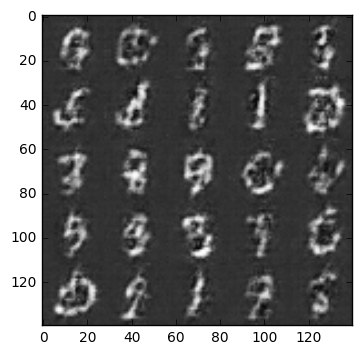

Epoch 1/2... Discriminator Loss: 0.0265... Generator Loss: 4.2839
Epoch 1/2... Discriminator Loss: 0.0272... Generator Loss: 4.8174
Epoch 1/2... Discriminator Loss: 0.0206... Generator Loss: 5.0840
Epoch 1/2... Discriminator Loss: 0.0318... Generator Loss: 4.9357
Epoch 1/2... Discriminator Loss: 0.0328... Generator Loss: 4.3349
Epoch 1/2... Discriminator Loss: 0.0409... Generator Loss: 3.7910
Epoch 1/2... Discriminator Loss: 0.0523... Generator Loss: 4.1132
Epoch 1/2... Discriminator Loss: 0.0643... Generator Loss: 3.1958
Epoch 1/2... Discriminator Loss: 0.0271... Generator Loss: 4.1372
Epoch 1/2... Discriminator Loss: 0.0252... Generator Loss: 4.4689


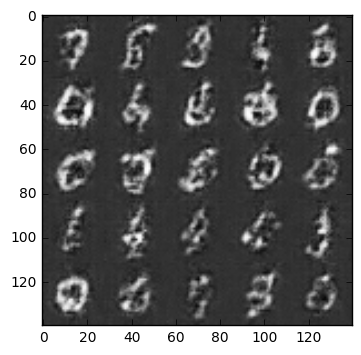

Epoch 1/2... Discriminator Loss: 0.0460... Generator Loss: 3.8743
Epoch 1/2... Discriminator Loss: 0.3054... Generator Loss: 1.6516
Epoch 1/2... Discriminator Loss: 0.9286... Generator Loss: 0.7249
Epoch 1/2... Discriminator Loss: 0.0229... Generator Loss: 4.6689
Epoch 1/2... Discriminator Loss: 0.0469... Generator Loss: 3.7804
Epoch 1/2... Discriminator Loss: 0.0495... Generator Loss: 3.5347
Epoch 1/2... Discriminator Loss: 0.0351... Generator Loss: 3.8898
Epoch 2/2... Discriminator Loss: 0.0299... Generator Loss: 4.2035
Epoch 2/2... Discriminator Loss: 0.0381... Generator Loss: 4.1838
Epoch 2/2... Discriminator Loss: 0.0313... Generator Loss: 4.0778


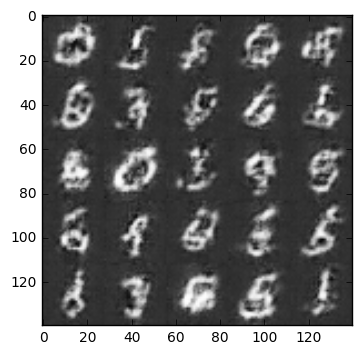

Epoch 2/2... Discriminator Loss: 0.0374... Generator Loss: 4.0494
Epoch 2/2... Discriminator Loss: 0.0598... Generator Loss: 3.2186
Epoch 2/2... Discriminator Loss: 0.0328... Generator Loss: 4.4121
Epoch 2/2... Discriminator Loss: 0.0826... Generator Loss: 2.9919
Epoch 2/2... Discriminator Loss: 0.0142... Generator Loss: 5.2073
Epoch 2/2... Discriminator Loss: 0.0396... Generator Loss: 4.0865
Epoch 2/2... Discriminator Loss: 0.0504... Generator Loss: 3.4836
Epoch 2/2... Discriminator Loss: 0.0405... Generator Loss: 4.3643
Epoch 2/2... Discriminator Loss: 0.0266... Generator Loss: 4.2135
Epoch 2/2... Discriminator Loss: 0.0310... Generator Loss: 4.2483


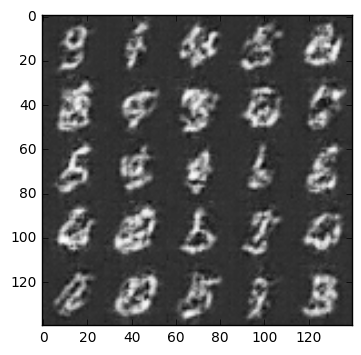

Epoch 2/2... Discriminator Loss: 0.0341... Generator Loss: 3.8209
Epoch 2/2... Discriminator Loss: 0.0394... Generator Loss: 3.8437
Epoch 2/2... Discriminator Loss: 0.0146... Generator Loss: 5.0190
Epoch 2/2... Discriminator Loss: 0.0113... Generator Loss: 5.1207
Epoch 2/2... Discriminator Loss: 0.0322... Generator Loss: 4.2190
Epoch 2/2... Discriminator Loss: 0.0761... Generator Loss: 2.9399
Epoch 2/2... Discriminator Loss: 0.0338... Generator Loss: 3.8898
Epoch 2/2... Discriminator Loss: 0.0366... Generator Loss: 3.9482
Epoch 2/2... Discriminator Loss: 0.0349... Generator Loss: 4.3061
Epoch 2/2... Discriminator Loss: 0.0365... Generator Loss: 3.8483


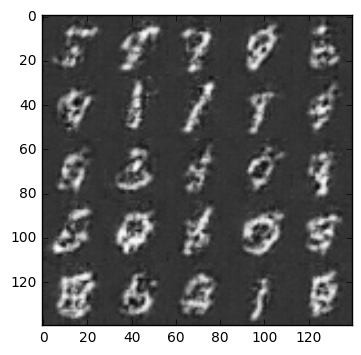

Epoch 2/2... Discriminator Loss: 0.0203... Generator Loss: 4.9870
Epoch 2/2... Discriminator Loss: 0.0266... Generator Loss: 4.1527
Epoch 2/2... Discriminator Loss: 0.0500... Generator Loss: 3.5401
Epoch 2/2... Discriminator Loss: 0.0782... Generator Loss: 3.1203
Epoch 2/2... Discriminator Loss: 0.0351... Generator Loss: 4.1166
Epoch 2/2... Discriminator Loss: 0.0630... Generator Loss: 3.4088
Epoch 2/2... Discriminator Loss: 0.0168... Generator Loss: 4.8731
Epoch 2/2... Discriminator Loss: 0.0326... Generator Loss: 4.0214
Epoch 2/2... Discriminator Loss: 0.0190... Generator Loss: 4.5577
Epoch 2/2... Discriminator Loss: 0.1859... Generator Loss: 1.9783


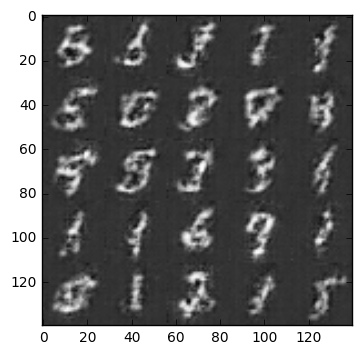

Epoch 2/2... Discriminator Loss: 0.0361... Generator Loss: 4.7002
Epoch 2/2... Discriminator Loss: 0.0233... Generator Loss: 4.3312
Epoch 2/2... Discriminator Loss: 0.0694... Generator Loss: 3.1598
Epoch 2/2... Discriminator Loss: 0.0241... Generator Loss: 4.2993
Epoch 2/2... Discriminator Loss: 0.1667... Generator Loss: 2.2100
Epoch 2/2... Discriminator Loss: 0.2222... Generator Loss: 3.9207
Epoch 2/2... Discriminator Loss: 0.1646... Generator Loss: 2.5970
Epoch 2/2... Discriminator Loss: 0.1735... Generator Loss: 2.8274
Epoch 2/2... Discriminator Loss: 0.0863... Generator Loss: 3.1927
Epoch 2/2... Discriminator Loss: 0.0558... Generator Loss: 3.5703


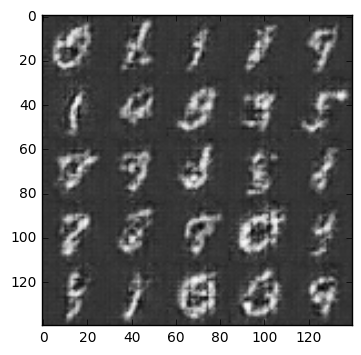

Epoch 2/2... Discriminator Loss: 0.2002... Generator Loss: 2.1236
Epoch 2/2... Discriminator Loss: 0.2030... Generator Loss: 2.1447
Epoch 2/2... Discriminator Loss: 0.1114... Generator Loss: 2.6468
Epoch 2/2... Discriminator Loss: 0.0468... Generator Loss: 3.5010
Epoch 2/2... Discriminator Loss: 0.1634... Generator Loss: 2.3628
Epoch 2/2... Discriminator Loss: 0.0882... Generator Loss: 3.3291
Epoch 2/2... Discriminator Loss: 0.0492... Generator Loss: 3.8700
Epoch 2/2... Discriminator Loss: 0.0438... Generator Loss: 3.6031
Epoch 2/2... Discriminator Loss: 0.1014... Generator Loss: 2.8473
Epoch 2/2... Discriminator Loss: 0.0400... Generator Loss: 3.8609


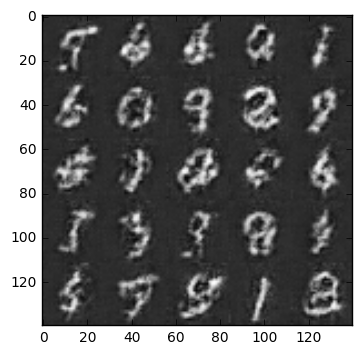

Epoch 2/2... Discriminator Loss: 0.0897... Generator Loss: 2.8828
Epoch 2/2... Discriminator Loss: 0.0568... Generator Loss: 3.4100
Epoch 2/2... Discriminator Loss: 0.0875... Generator Loss: 3.0746
Epoch 2/2... Discriminator Loss: 0.1226... Generator Loss: 2.5428
Epoch 2/2... Discriminator Loss: 0.0905... Generator Loss: 2.7629
Epoch 2/2... Discriminator Loss: 0.0978... Generator Loss: 3.2201
Epoch 2/2... Discriminator Loss: 0.5467... Generator Loss: 1.5356
Epoch 2/2... Discriminator Loss: 0.1233... Generator Loss: 2.6908
Epoch 2/2... Discriminator Loss: 0.2854... Generator Loss: 1.7226
Epoch 2/2... Discriminator Loss: 0.2157... Generator Loss: 2.0435


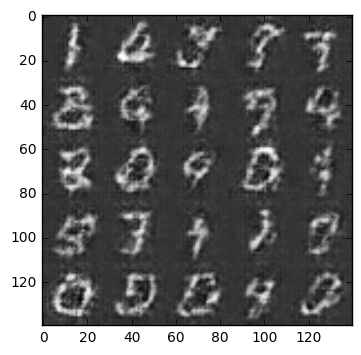

Epoch 2/2... Discriminator Loss: 0.1562... Generator Loss: 2.2970
Epoch 2/2... Discriminator Loss: 0.1330... Generator Loss: 2.6833
Epoch 2/2... Discriminator Loss: 0.0971... Generator Loss: 2.8930
Epoch 2/2... Discriminator Loss: 0.1493... Generator Loss: 2.7834
Epoch 2/2... Discriminator Loss: 0.1622... Generator Loss: 2.2650
Epoch 2/2... Discriminator Loss: 0.1836... Generator Loss: 2.2491
Epoch 2/2... Discriminator Loss: 0.2078... Generator Loss: 2.0684
Epoch 2/2... Discriminator Loss: 0.0536... Generator Loss: 3.3829
Epoch 2/2... Discriminator Loss: 0.1363... Generator Loss: 2.4751
Epoch 2/2... Discriminator Loss: 0.0887... Generator Loss: 3.0955


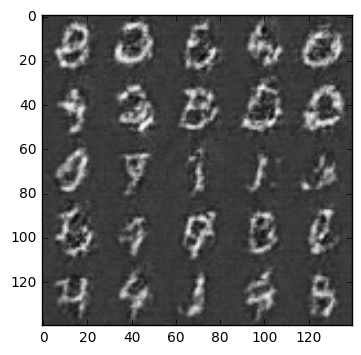

Epoch 2/2... Discriminator Loss: 0.1335... Generator Loss: 2.4846
Epoch 2/2... Discriminator Loss: 0.0620... Generator Loss: 3.2023
Epoch 2/2... Discriminator Loss: 0.1402... Generator Loss: 2.4657
Epoch 2/2... Discriminator Loss: 0.2536... Generator Loss: 1.7340
Epoch 2/2... Discriminator Loss: 0.1853... Generator Loss: 2.1649
Epoch 2/2... Discriminator Loss: 0.1157... Generator Loss: 2.6588
Epoch 2/2... Discriminator Loss: 0.0369... Generator Loss: 3.9278
Epoch 2/2... Discriminator Loss: 0.0867... Generator Loss: 3.0582
Epoch 2/2... Discriminator Loss: 0.0278... Generator Loss: 4.1189
Epoch 2/2... Discriminator Loss: 0.2290... Generator Loss: 1.9050


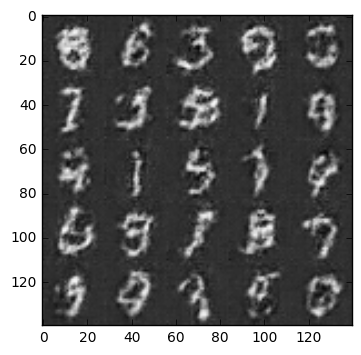

Epoch 2/2... Discriminator Loss: 0.1258... Generator Loss: 2.4635
Epoch 2/2... Discriminator Loss: 0.0886... Generator Loss: 2.9331
Epoch 2/2... Discriminator Loss: 0.1471... Generator Loss: 2.2812
Epoch 2/2... Discriminator Loss: 0.1418... Generator Loss: 2.4039
Epoch 2/2... Discriminator Loss: 0.0858... Generator Loss: 3.0690
Epoch 2/2... Discriminator Loss: 0.1313... Generator Loss: 2.4393
Epoch 2/2... Discriminator Loss: 0.0977... Generator Loss: 2.7690
Epoch 2/2... Discriminator Loss: 0.1619... Generator Loss: 2.1596
Epoch 2/2... Discriminator Loss: 0.0877... Generator Loss: 3.1394
Epoch 2/2... Discriminator Loss: 0.2251... Generator Loss: 1.9249


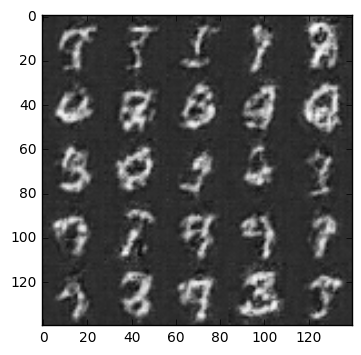

Epoch 2/2... Discriminator Loss: 0.1301... Generator Loss: 2.4946
Epoch 2/2... Discriminator Loss: 0.2151... Generator Loss: 2.1275
Epoch 2/2... Discriminator Loss: 0.0728... Generator Loss: 3.0727
Epoch 2/2... Discriminator Loss: 0.0763... Generator Loss: 2.9380
Epoch 2/2... Discriminator Loss: 0.0670... Generator Loss: 3.1831
Epoch 2/2... Discriminator Loss: 0.1170... Generator Loss: 2.6225
Epoch 2/2... Discriminator Loss: 0.1018... Generator Loss: 2.9244
Epoch 2/2... Discriminator Loss: 0.1014... Generator Loss: 2.7148
Epoch 2/2... Discriminator Loss: 0.0751... Generator Loss: 3.0330
Epoch 2/2... Discriminator Loss: 0.1825... Generator Loss: 2.1428


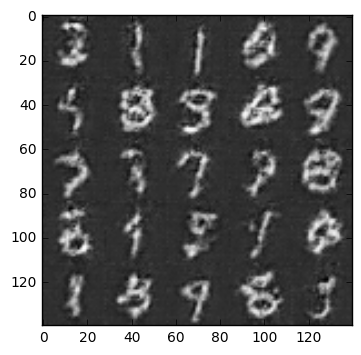

Epoch 2/2... Discriminator Loss: 0.1307... Generator Loss: 2.4630
Epoch 2/2... Discriminator Loss: 0.0825... Generator Loss: 2.8362
Epoch 2/2... Discriminator Loss: 0.0591... Generator Loss: 3.3997
Epoch 2/2... Discriminator Loss: 0.0558... Generator Loss: 3.5674
Epoch 2/2... Discriminator Loss: 0.0636... Generator Loss: 3.3199
Epoch 2/2... Discriminator Loss: 0.0425... Generator Loss: 3.7499
Epoch 2/2... Discriminator Loss: 0.0879... Generator Loss: 2.8495
Epoch 2/2... Discriminator Loss: 0.0809... Generator Loss: 2.8734
Epoch 2/2... Discriminator Loss: 0.1548... Generator Loss: 2.4182
Epoch 2/2... Discriminator Loss: 0.0610... Generator Loss: 3.2035


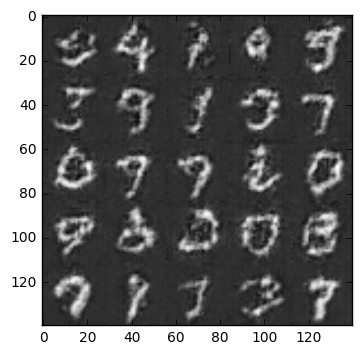

Epoch 2/2... Discriminator Loss: 0.0928... Generator Loss: 2.8201
Epoch 2/2... Discriminator Loss: 0.1259... Generator Loss: 2.5578
Epoch 2/2... Discriminator Loss: 0.1977... Generator Loss: 2.1450
Epoch 2/2... Discriminator Loss: 0.0993... Generator Loss: 2.8750
Epoch 2/2... Discriminator Loss: 0.0484... Generator Loss: 3.7756
Epoch 2/2... Discriminator Loss: 0.0596... Generator Loss: 3.4072
Epoch 2/2... Discriminator Loss: 0.0317... Generator Loss: 4.3842
Epoch 2/2... Discriminator Loss: 0.0938... Generator Loss: 2.9026
Epoch 2/2... Discriminator Loss: 0.1600... Generator Loss: 2.3288
Epoch 2/2... Discriminator Loss: 0.0470... Generator Loss: 3.7387


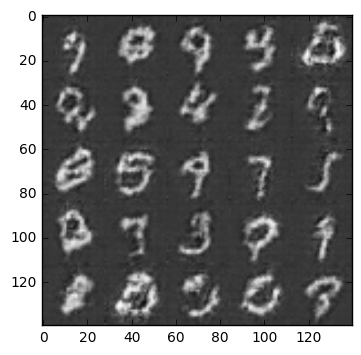

Epoch 2/2... Discriminator Loss: 0.0862... Generator Loss: 3.0630
Epoch 2/2... Discriminator Loss: 0.1799... Generator Loss: 2.3129
Epoch 2/2... Discriminator Loss: 0.0554... Generator Loss: 3.4722
Epoch 2/2... Discriminator Loss: 0.1051... Generator Loss: 2.7970
Epoch 2/2... Discriminator Loss: 0.0450... Generator Loss: 3.8145
Epoch 2/2... Discriminator Loss: 0.0638... Generator Loss: 3.3753
Epoch 2/2... Discriminator Loss: 0.1805... Generator Loss: 2.1145
Epoch 2/2... Discriminator Loss: 0.0665... Generator Loss: 3.3190
Epoch 2/2... Discriminator Loss: 0.0963... Generator Loss: 2.8776
Epoch 2/2... Discriminator Loss: 0.0699... Generator Loss: 3.0679


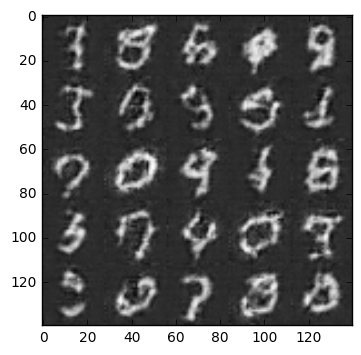

Epoch 2/2... Discriminator Loss: 0.0503... Generator Loss: 3.7812
Epoch 2/2... Discriminator Loss: 0.2054... Generator Loss: 2.0573
Epoch 2/2... Discriminator Loss: 0.1455... Generator Loss: 2.4671
Epoch 2/2... Discriminator Loss: 0.0987... Generator Loss: 3.0197
Epoch 2/2... Discriminator Loss: 0.0775... Generator Loss: 3.1616
Epoch 2/2... Discriminator Loss: 0.0619... Generator Loss: 3.3017
Epoch 2/2... Discriminator Loss: 0.0192... Generator Loss: 4.7293
Epoch 2/2... Discriminator Loss: 0.1213... Generator Loss: 2.6281
Epoch 2/2... Discriminator Loss: 0.0979... Generator Loss: 2.7743
Epoch 2/2... Discriminator Loss: 0.0649... Generator Loss: 3.2977


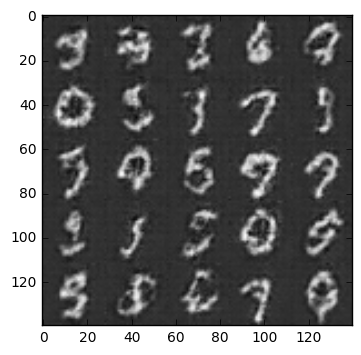

Epoch 2/2... Discriminator Loss: 0.1318... Generator Loss: 2.5226
Epoch 2/2... Discriminator Loss: 0.0174... Generator Loss: 4.8565
Epoch 2/2... Discriminator Loss: 0.0191... Generator Loss: 4.4861
Epoch 2/2... Discriminator Loss: 0.0245... Generator Loss: 4.1947
Epoch 2/2... Discriminator Loss: 0.1931... Generator Loss: 2.1100
Epoch 2/2... Discriminator Loss: 0.0506... Generator Loss: 3.4761
Epoch 2/2... Discriminator Loss: 0.0545... Generator Loss: 3.5049
Epoch 2/2... Discriminator Loss: 0.0363... Generator Loss: 3.9823
Epoch 2/2... Discriminator Loss: 0.0424... Generator Loss: 3.8347
Epoch 2/2... Discriminator Loss: 0.0890... Generator Loss: 2.9496


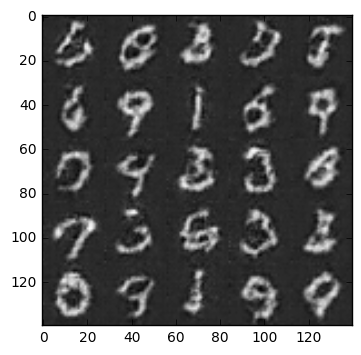

Epoch 2/2... Discriminator Loss: 0.1789... Generator Loss: 2.1253
Epoch 2/2... Discriminator Loss: 9.1714... Generator Loss: 17.2878
Epoch 2/2... Discriminator Loss: 1.3115... Generator Loss: 0.6788
Epoch 2/2... Discriminator Loss: 1.2989... Generator Loss: 0.6507
Epoch 2/2... Discriminator Loss: 1.3131... Generator Loss: 1.2082
Epoch 2/2... Discriminator Loss: 0.7216... Generator Loss: 1.5704
Epoch 2/2... Discriminator Loss: 0.7454... Generator Loss: 2.8953
Epoch 2/2... Discriminator Loss: 0.9497... Generator Loss: 0.7619
Epoch 2/2... Discriminator Loss: 0.3797... Generator Loss: 1.8689
Epoch 2/2... Discriminator Loss: 0.2438... Generator Loss: 2.3694


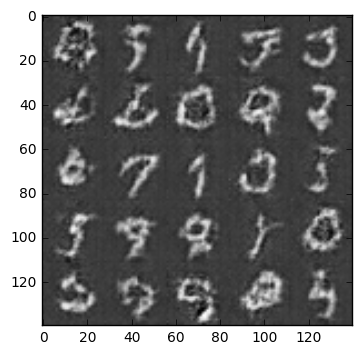

Epoch 2/2... Discriminator Loss: 0.2830... Generator Loss: 1.9396
Epoch 2/2... Discriminator Loss: 0.2121... Generator Loss: 2.3329
Epoch 2/2... Discriminator Loss: 0.2330... Generator Loss: 2.0049
Epoch 2/2... Discriminator Loss: 0.8026... Generator Loss: 4.6335
Epoch 2/2... Discriminator Loss: 0.1713... Generator Loss: 2.6826
Epoch 2/2... Discriminator Loss: 0.2052... Generator Loss: 2.5070
Epoch 2/2... Discriminator Loss: 0.1258... Generator Loss: 2.7507
Epoch 2/2... Discriminator Loss: 0.0973... Generator Loss: 2.7279
Epoch 2/2... Discriminator Loss: 0.4962... Generator Loss: 1.2330
Epoch 2/2... Discriminator Loss: 0.1460... Generator Loss: 2.6866


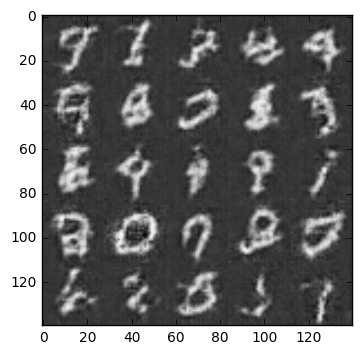

Epoch 2/2... Discriminator Loss: 0.0643... Generator Loss: 3.5241
Epoch 2/2... Discriminator Loss: 0.1736... Generator Loss: 2.3395
Epoch 2/2... Discriminator Loss: 0.1259... Generator Loss: 2.5148
Epoch 2/2... Discriminator Loss: 0.5924... Generator Loss: 1.0414
Epoch 2/2... Discriminator Loss: 0.0903... Generator Loss: 2.8877
Epoch 2/2... Discriminator Loss: 0.1048... Generator Loss: 2.9010
Epoch 2/2... Discriminator Loss: 0.0979... Generator Loss: 2.8412
Epoch 2/2... Discriminator Loss: 0.2618... Generator Loss: 1.7585
Epoch 2/2... Discriminator Loss: 0.2316... Generator Loss: 1.8309
Epoch 2/2... Discriminator Loss: 0.1525... Generator Loss: 2.3774


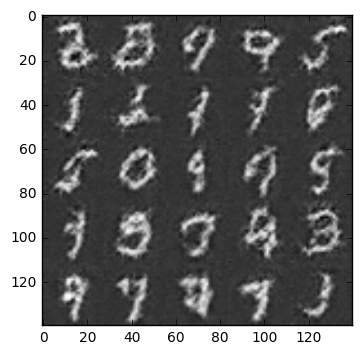

Epoch 2/2... Discriminator Loss: 0.1477... Generator Loss: 2.3042
Epoch 2/2... Discriminator Loss: 0.1112... Generator Loss: 2.6427
Epoch 2/2... Discriminator Loss: 0.0872... Generator Loss: 2.8366
Epoch 2/2... Discriminator Loss: 0.1537... Generator Loss: 2.3127
Epoch 2/2... Discriminator Loss: 0.1250... Generator Loss: 2.4606


In [91]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.8254... Generator Loss: 0.3365
Epoch 1/1... Discriminator Loss: 1.4878... Generator Loss: 0.5386
Epoch 1/1... Discriminator Loss: 0.9662... Generator Loss: 0.8947
Epoch 1/1... Discriminator Loss: 1.0755... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 0.8662
Epoch 1/1... Discriminator Loss: 0.6833... Generator Loss: 1.0990
Epoch 1/1... Discriminator Loss: 0.6197... Generator Loss: 1.5593
Epoch 1/1... Discriminator Loss: 0.9156... Generator Loss: 0.7406
Epoch 1/1... Discriminator Loss: 1.5335... Generator Loss: 3.3071
Epoch 1/1... Discriminator Loss: 0.5796... Generator Loss: 1.4388


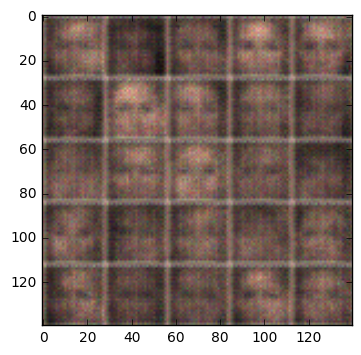

Epoch 1/1... Discriminator Loss: 0.4838... Generator Loss: 1.4056
Epoch 1/1... Discriminator Loss: 0.4299... Generator Loss: 1.3657
Epoch 1/1... Discriminator Loss: 0.2224... Generator Loss: 2.6768
Epoch 1/1... Discriminator Loss: 0.3185... Generator Loss: 1.9047
Epoch 1/1... Discriminator Loss: 0.1834... Generator Loss: 2.4332
Epoch 1/1... Discriminator Loss: 0.0942... Generator Loss: 3.2214
Epoch 1/1... Discriminator Loss: 0.2152... Generator Loss: 2.7114
Epoch 1/1... Discriminator Loss: 0.1050... Generator Loss: 3.7455
Epoch 1/1... Discriminator Loss: 0.3579... Generator Loss: 1.5107
Epoch 1/1... Discriminator Loss: 0.0676... Generator Loss: 4.2994


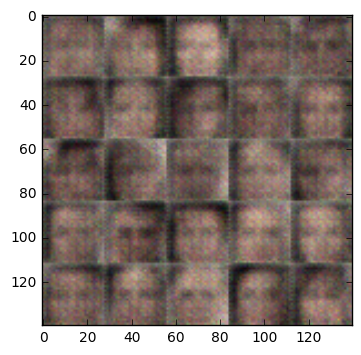

Epoch 1/1... Discriminator Loss: 0.6660... Generator Loss: 3.4112
Epoch 1/1... Discriminator Loss: 0.5040... Generator Loss: 3.8311
Epoch 1/1... Discriminator Loss: 1.0073... Generator Loss: 0.6104
Epoch 1/1... Discriminator Loss: 0.3235... Generator Loss: 1.7122
Epoch 1/1... Discriminator Loss: 0.7561... Generator Loss: 1.5656
Epoch 1/1... Discriminator Loss: 0.1270... Generator Loss: 3.8416
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.4084
Epoch 1/1... Discriminator Loss: 1.0045... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 0.5779... Generator Loss: 4.1761
Epoch 1/1... Discriminator Loss: 0.1550... Generator Loss: 3.8032


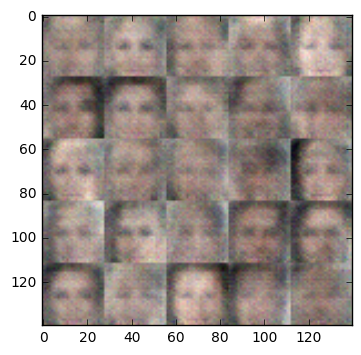

Epoch 1/1... Discriminator Loss: 0.3343... Generator Loss: 2.0019
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 0.3726
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.4689... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.2585... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.1154... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.4842
Epoch 1/1... Discriminator Loss: 1.0823... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 0.7646... Generator Loss: 1.0710
Epoch 1/1... Discriminator Loss: 0.7971... Generator Loss: 0.8981


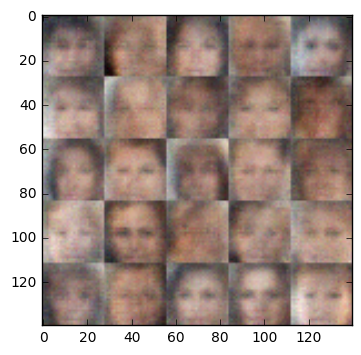

Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 1.0393
Epoch 1/1... Discriminator Loss: 0.6807... Generator Loss: 1.2396
Epoch 1/1... Discriminator Loss: 1.0913... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 0.7902... Generator Loss: 1.0232
Epoch 1/1... Discriminator Loss: 0.8124... Generator Loss: 0.8775
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 0.4498
Epoch 1/1... Discriminator Loss: 0.7390... Generator Loss: 1.1722
Epoch 1/1... Discriminator Loss: 0.4177... Generator Loss: 1.5790
Epoch 1/1... Discriminator Loss: 0.2830... Generator Loss: 2.8723
Epoch 1/1... Discriminator Loss: 0.1702... Generator Loss: 3.4685


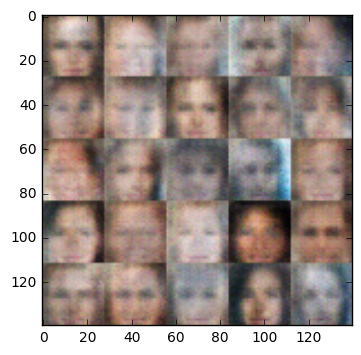

Epoch 1/1... Discriminator Loss: 0.2599... Generator Loss: 2.1063
Epoch 1/1... Discriminator Loss: 0.4454... Generator Loss: 1.4066
Epoch 1/1... Discriminator Loss: 0.3984... Generator Loss: 3.2820
Epoch 1/1... Discriminator Loss: 1.9221... Generator Loss: 0.2595
Epoch 1/1... Discriminator Loss: 0.3723... Generator Loss: 2.6002
Epoch 1/1... Discriminator Loss: 0.1528... Generator Loss: 4.1111
Epoch 1/1... Discriminator Loss: 0.1262... Generator Loss: 3.1401
Epoch 1/1... Discriminator Loss: 0.1119... Generator Loss: 3.8664
Epoch 1/1... Discriminator Loss: 0.2352... Generator Loss: 3.5227
Epoch 1/1... Discriminator Loss: 0.0206... Generator Loss: 7.1993


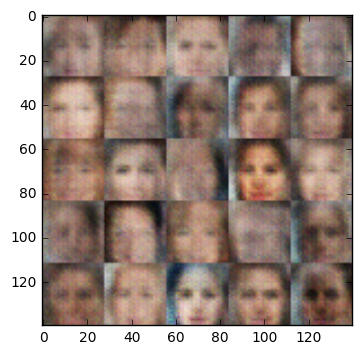

Epoch 1/1... Discriminator Loss: 0.0610... Generator Loss: 10.4574
Epoch 1/1... Discriminator Loss: 0.0499... Generator Loss: 4.4111
Epoch 1/1... Discriminator Loss: 0.0611... Generator Loss: 5.5175
Epoch 1/1... Discriminator Loss: 0.1414... Generator Loss: 5.9071
Epoch 1/1... Discriminator Loss: 0.0541... Generator Loss: 5.7125
Epoch 1/1... Discriminator Loss: 0.0617... Generator Loss: 6.7194
Epoch 1/1... Discriminator Loss: 1.1775... Generator Loss: 0.4795
Epoch 1/1... Discriminator Loss: 0.0332... Generator Loss: 6.5876
Epoch 1/1... Discriminator Loss: 0.1559... Generator Loss: 5.0085
Epoch 1/1... Discriminator Loss: 0.0371... Generator Loss: 4.9856


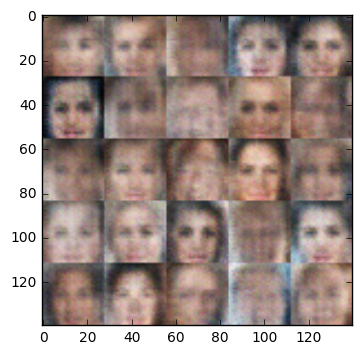

Epoch 1/1... Discriminator Loss: 0.0311... Generator Loss: 13.2520
Epoch 1/1... Discriminator Loss: 0.0685... Generator Loss: 5.2695
Epoch 1/1... Discriminator Loss: 0.9492... Generator Loss: 1.5921
Epoch 1/1... Discriminator Loss: 0.1140... Generator Loss: 13.6162
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.3397
Epoch 1/1... Discriminator Loss: 0.4451... Generator Loss: 1.5218
Epoch 1/1... Discriminator Loss: 0.6016... Generator Loss: 1.2425
Epoch 1/1... Discriminator Loss: 0.2749... Generator Loss: 1.6744
Epoch 1/1... Discriminator Loss: 0.1057... Generator Loss: 8.5527
Epoch 1/1... Discriminator Loss: 0.2066... Generator Loss: 10.8466


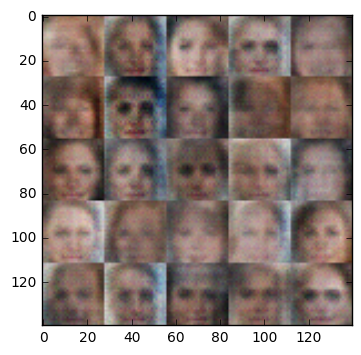

Epoch 1/1... Discriminator Loss: 0.2218... Generator Loss: 8.7319
Epoch 1/1... Discriminator Loss: 0.0481... Generator Loss: 5.8865
Epoch 1/1... Discriminator Loss: 0.0465... Generator Loss: 8.1065
Epoch 1/1... Discriminator Loss: 0.0277... Generator Loss: 10.7293
Epoch 1/1... Discriminator Loss: 0.0516... Generator Loss: 6.4324
Epoch 1/1... Discriminator Loss: 0.1898... Generator Loss: 2.3464
Epoch 1/1... Discriminator Loss: 0.0100... Generator Loss: 8.2213
Epoch 1/1... Discriminator Loss: 0.1085... Generator Loss: 12.3628
Epoch 1/1... Discriminator Loss: 0.0453... Generator Loss: 10.7610
Epoch 1/1... Discriminator Loss: 0.0984... Generator Loss: 10.2224


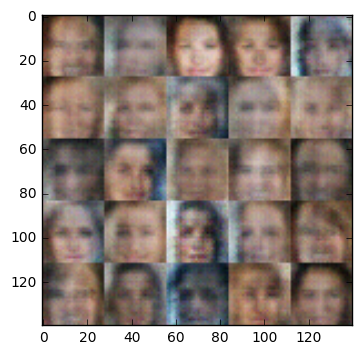

Epoch 1/1... Discriminator Loss: 0.3503... Generator Loss: 2.0621
Epoch 1/1... Discriminator Loss: 0.5252... Generator Loss: 1.2640
Epoch 1/1... Discriminator Loss: 1.2633... Generator Loss: 0.4802
Epoch 1/1... Discriminator Loss: 0.0582... Generator Loss: 5.0549
Epoch 1/1... Discriminator Loss: 0.0446... Generator Loss: 10.6068
Epoch 1/1... Discriminator Loss: 0.4711... Generator Loss: 1.5253
Epoch 1/1... Discriminator Loss: 0.0747... Generator Loss: 3.4555
Epoch 1/1... Discriminator Loss: 0.1248... Generator Loss: 11.3730
Epoch 1/1... Discriminator Loss: 0.2655... Generator Loss: 11.1462
Epoch 1/1... Discriminator Loss: 0.0448... Generator Loss: 11.2101


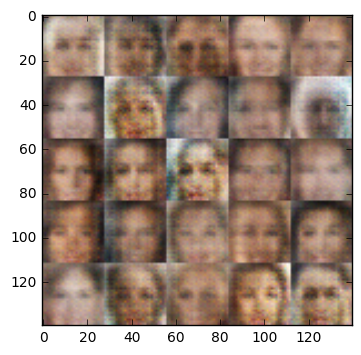

Epoch 1/1... Discriminator Loss: 0.1470... Generator Loss: 2.3069
Epoch 1/1... Discriminator Loss: 0.2891... Generator Loss: 11.8247
Epoch 1/1... Discriminator Loss: 0.5946... Generator Loss: 1.0175
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 8.8891
Epoch 1/1... Discriminator Loss: 0.2535... Generator Loss: 8.4311
Epoch 1/1... Discriminator Loss: 0.0798... Generator Loss: 14.3685
Epoch 1/1... Discriminator Loss: 0.0648... Generator Loss: 3.7323
Epoch 1/1... Discriminator Loss: 0.0268... Generator Loss: 15.7305
Epoch 1/1... Discriminator Loss: 0.1413... Generator Loss: 2.4230
Epoch 1/1... Discriminator Loss: 0.0334... Generator Loss: 5.0612


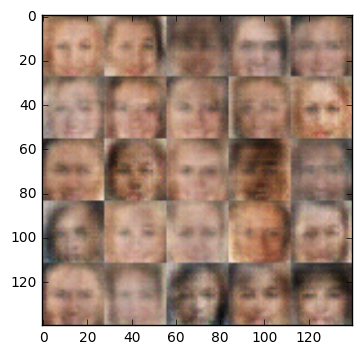

Epoch 1/1... Discriminator Loss: 0.0426... Generator Loss: 5.2393
Epoch 1/1... Discriminator Loss: 0.0192... Generator Loss: 9.8842
Epoch 1/1... Discriminator Loss: 0.0070... Generator Loss: 6.0278
Epoch 1/1... Discriminator Loss: 0.0518... Generator Loss: 4.4144
Epoch 1/1... Discriminator Loss: 0.0140... Generator Loss: 8.4752
Epoch 1/1... Discriminator Loss: 0.0064... Generator Loss: 6.8460
Epoch 1/1... Discriminator Loss: 0.0411... Generator Loss: 3.8988
Epoch 1/1... Discriminator Loss: 0.1754... Generator Loss: 2.8100
Epoch 1/1... Discriminator Loss: 0.5745... Generator Loss: 10.2000
Epoch 1/1... Discriminator Loss: 0.2864... Generator Loss: 1.7790


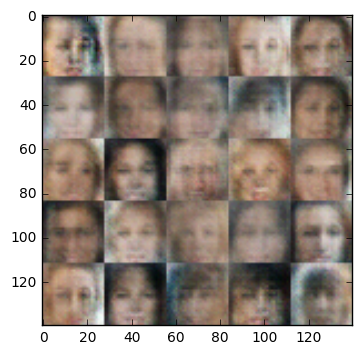

Epoch 1/1... Discriminator Loss: 0.0327... Generator Loss: 7.9916
Epoch 1/1... Discriminator Loss: 0.0117... Generator Loss: 14.1963
Epoch 1/1... Discriminator Loss: 0.0136... Generator Loss: 11.3312
Epoch 1/1... Discriminator Loss: 0.0355... Generator Loss: 6.0016
Epoch 1/1... Discriminator Loss: 0.2193... Generator Loss: 2.3651
Epoch 1/1... Discriminator Loss: 0.0069... Generator Loss: 10.3295
Epoch 1/1... Discriminator Loss: 0.0157... Generator Loss: 8.3390
Epoch 1/1... Discriminator Loss: 0.2226... Generator Loss: 2.0223
Epoch 1/1... Discriminator Loss: 0.0074... Generator Loss: 13.1797
Epoch 1/1... Discriminator Loss: 0.0368... Generator Loss: 4.0070


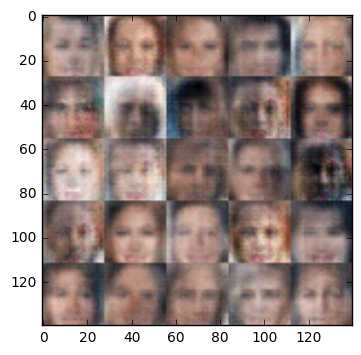

Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 9.6009
Epoch 1/1... Discriminator Loss: 0.2481... Generator Loss: 1.8305
Epoch 1/1... Discriminator Loss: 0.0593... Generator Loss: 14.1709
Epoch 1/1... Discriminator Loss: 0.0327... Generator Loss: 5.5383
Epoch 1/1... Discriminator Loss: 0.0066... Generator Loss: 7.7660
Epoch 1/1... Discriminator Loss: 0.0128... Generator Loss: 12.5041
Epoch 1/1... Discriminator Loss: 0.0155... Generator Loss: 12.4147
Epoch 1/1... Discriminator Loss: 0.0057... Generator Loss: 10.5989
Epoch 1/1... Discriminator Loss: 0.0068... Generator Loss: 8.1540
Epoch 1/1... Discriminator Loss: 0.0066... Generator Loss: 15.8549


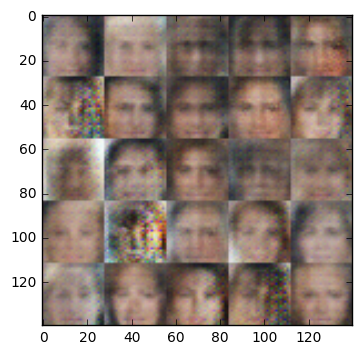

Epoch 1/1... Discriminator Loss: 0.0606... Generator Loss: 3.1695
Epoch 1/1... Discriminator Loss: 0.0282... Generator Loss: 5.1256
Epoch 1/1... Discriminator Loss: 0.0324... Generator Loss: 10.9330
Epoch 1/1... Discriminator Loss: 0.0098... Generator Loss: 12.3662
Epoch 1/1... Discriminator Loss: 0.0611... Generator Loss: 3.3245
Epoch 1/1... Discriminator Loss: 0.0450... Generator Loss: 5.7691
Epoch 1/1... Discriminator Loss: 0.0217... Generator Loss: 6.0692
Epoch 1/1... Discriminator Loss: 0.0277... Generator Loss: 4.4654
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 12.3456
Epoch 1/1... Discriminator Loss: 0.0185... Generator Loss: 5.3206


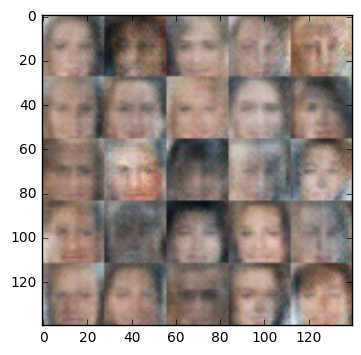

Epoch 1/1... Discriminator Loss: 0.0041... Generator Loss: 9.9518
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 7.4803
Epoch 1/1... Discriminator Loss: 0.0335... Generator Loss: 5.4300
Epoch 1/1... Discriminator Loss: 0.1227... Generator Loss: 3.1702
Epoch 1/1... Discriminator Loss: 0.0083... Generator Loss: 12.3674
Epoch 1/1... Discriminator Loss: 0.0229... Generator Loss: 8.5669
Epoch 1/1... Discriminator Loss: 0.1087... Generator Loss: 2.8569
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 15.9798
Epoch 1/1... Discriminator Loss: 0.0505... Generator Loss: 3.8521
Epoch 1/1... Discriminator Loss: 0.0112... Generator Loss: 9.6999


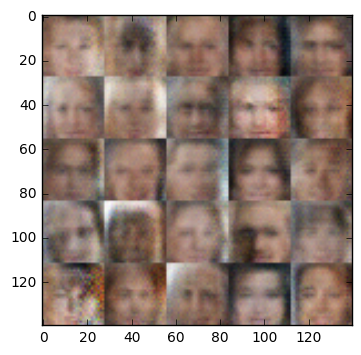

Epoch 1/1... Discriminator Loss: 0.0345... Generator Loss: 3.7599
Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 5.3988
Epoch 1/1... Discriminator Loss: 0.0065... Generator Loss: 14.7041
Epoch 1/1... Discriminator Loss: 0.0040... Generator Loss: 7.8235
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 11.1028
Epoch 1/1... Discriminator Loss: 0.0037... Generator Loss: 9.1601
Epoch 1/1... Discriminator Loss: 0.0176... Generator Loss: 5.8286
Epoch 1/1... Discriminator Loss: 0.4325... Generator Loss: 1.5117
Epoch 1/1... Discriminator Loss: 0.0120... Generator Loss: 5.4639
Epoch 1/1... Discriminator Loss: 0.0185... Generator Loss: 5.9171


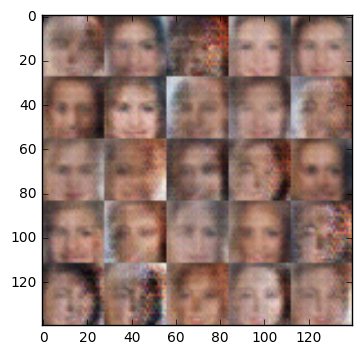

Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 7.6171
Epoch 1/1... Discriminator Loss: 0.0577... Generator Loss: 3.3037
Epoch 1/1... Discriminator Loss: 0.0098... Generator Loss: 6.1750
Epoch 1/1... Discriminator Loss: 0.0054... Generator Loss: 10.0182
Epoch 1/1... Discriminator Loss: 0.0078... Generator Loss: 8.3525
Epoch 1/1... Discriminator Loss: 0.0056... Generator Loss: 12.8841
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 7.4926
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 8.4867
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 13.5064
Epoch 1/1... Discriminator Loss: 0.0442... Generator Loss: 3.7084


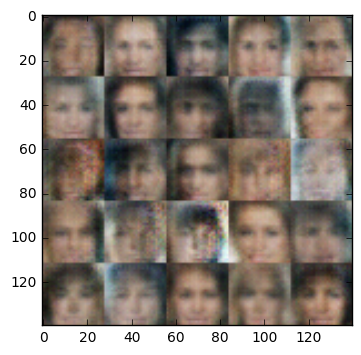

Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 8.9573
Epoch 1/1... Discriminator Loss: 0.0039... Generator Loss: 11.5070
Epoch 1/1... Discriminator Loss: 0.0079... Generator Loss: 12.5103
Epoch 1/1... Discriminator Loss: 0.0037... Generator Loss: 12.1826
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 12.7170
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 11.0386
Epoch 1/1... Discriminator Loss: 0.2868... Generator Loss: 1.7967
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 9.5492
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.4536
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 9.1609


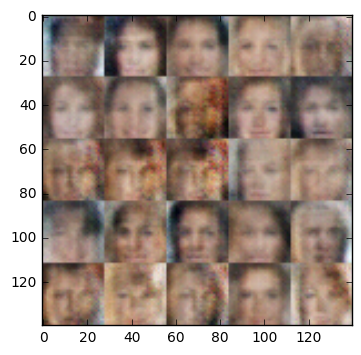

Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 10.5750
Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 11.9370
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 10.0670
Epoch 1/1... Discriminator Loss: 0.0038... Generator Loss: 9.3963
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 13.8136
Epoch 1/1... Discriminator Loss: 0.0324... Generator Loss: 4.5434
Epoch 1/1... Discriminator Loss: 0.0126... Generator Loss: 8.1979
Epoch 1/1... Discriminator Loss: 0.0083... Generator Loss: 14.4259
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 10.1696
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 8.4042


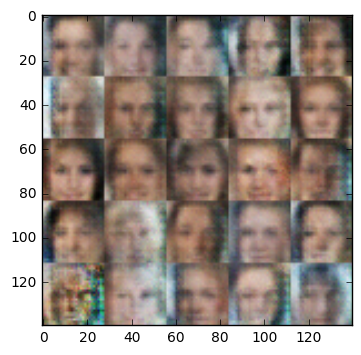

Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 8.5754
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 6.1552
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 9.9285
Epoch 1/1... Discriminator Loss: 0.0629... Generator Loss: 7.9702
Epoch 1/1... Discriminator Loss: 0.0243... Generator Loss: 16.5931
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.5170
Epoch 1/1... Discriminator Loss: 0.0593... Generator Loss: 11.3355
Epoch 1/1... Discriminator Loss: 0.0039... Generator Loss: 7.2427
Epoch 1/1... Discriminator Loss: 0.7115... Generator Loss: 0.7824
Epoch 1/1... Discriminator Loss: 0.0108... Generator Loss: 11.9722


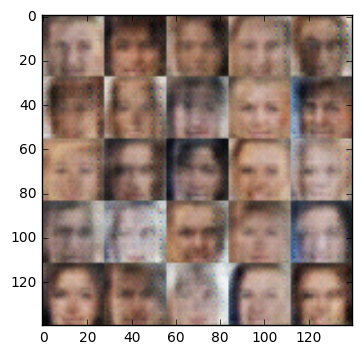

Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 8.8684
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.3006
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 10.3447
Epoch 1/1... Discriminator Loss: 0.0091... Generator Loss: 12.3118
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 8.0571
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 13.5982
Epoch 1/1... Discriminator Loss: 0.0622... Generator Loss: 3.4640
Epoch 1/1... Discriminator Loss: 0.0064... Generator Loss: 5.6648
Epoch 1/1... Discriminator Loss: 0.0323... Generator Loss: 3.8736
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 8.2627


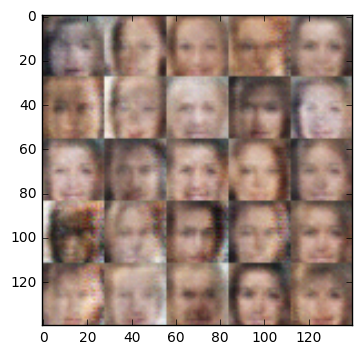

Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 9.8979
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 15.4241
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.8140
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 8.4579
Epoch 1/1... Discriminator Loss: 0.2794... Generator Loss: 1.9483
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.7544
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 10.2592
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 13.0498
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 9.4308
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 10.3202


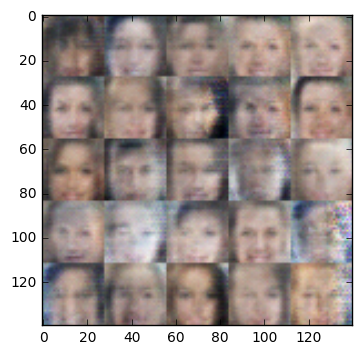

Epoch 1/1... Discriminator Loss: 0.0098... Generator Loss: 15.3856
Epoch 1/1... Discriminator Loss: 0.0039... Generator Loss: 12.1845
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 10.1622
Epoch 1/1... Discriminator Loss: 0.1565... Generator Loss: 2.4373
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 8.3556
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 6.4368
Epoch 1/1... Discriminator Loss: 0.0321... Generator Loss: 7.3029
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 13.3759
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 10.0600
Epoch 1/1... Discriminator Loss: 0.0062... Generator Loss: 12.0587


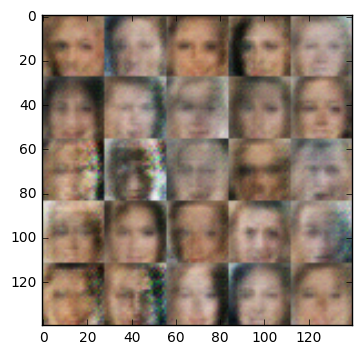

Epoch 1/1... Discriminator Loss: 0.1192... Generator Loss: 4.5918
Epoch 1/1... Discriminator Loss: 0.0038... Generator Loss: 7.5849
Epoch 1/1... Discriminator Loss: 0.0054... Generator Loss: 11.0409
Epoch 1/1... Discriminator Loss: 0.0116... Generator Loss: 5.6005
Epoch 1/1... Discriminator Loss: 0.1962... Generator Loss: 2.4660
Epoch 1/1... Discriminator Loss: 0.0827... Generator Loss: 3.0399
Epoch 1/1... Discriminator Loss: 0.5617... Generator Loss: 10.2867
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 7.2949
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 12.5546
Epoch 1/1... Discriminator Loss: 0.0167... Generator Loss: 5.8044


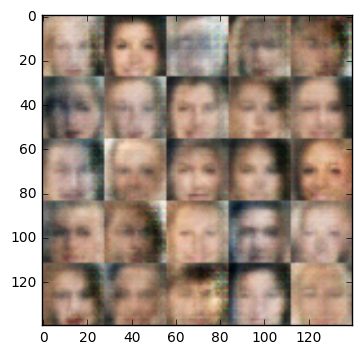

Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 13.4298
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 14.1334
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 12.3815
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 8.5754
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 14.3314
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 9.4529
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 10.4830
Epoch 1/1... Discriminator Loss: 0.0173... Generator Loss: 12.4822
Epoch 1/1... Discriminator Loss: 0.0064... Generator Loss: 9.6511
Epoch 1/1... Discriminator Loss: 0.0128... Generator Loss: 5.0003


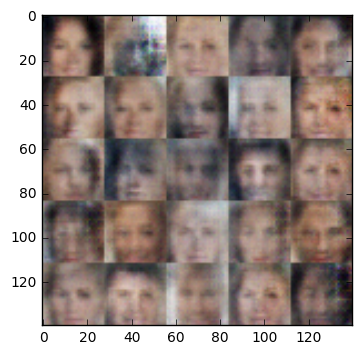

Epoch 1/1... Discriminator Loss: 0.0035... Generator Loss: 8.8623
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 8.6629
Epoch 1/1... Discriminator Loss: 0.0080... Generator Loss: 11.0967
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 13.2790
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 8.0958
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 8.6628
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 11.4756
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 12.2601
Epoch 1/1... Discriminator Loss: 0.0068... Generator Loss: 9.7687
Epoch 1/1... Discriminator Loss: 0.0052... Generator Loss: 7.0565


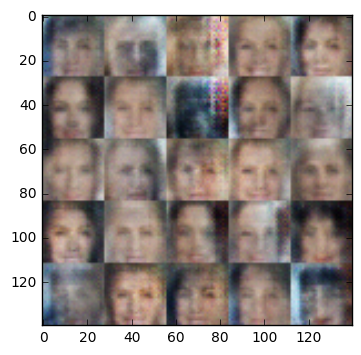

Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 10.6430
Epoch 1/1... Discriminator Loss: 0.0113... Generator Loss: 5.3967
Epoch 1/1... Discriminator Loss: 0.0167... Generator Loss: 10.3014
Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 5.6631
Epoch 1/1... Discriminator Loss: 0.0156... Generator Loss: 10.0018
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 10.9285
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 12.2946
Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 6.5137
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 7.6166
Epoch 1/1... Discriminator Loss: 0.0993... Generator Loss: 2.7414


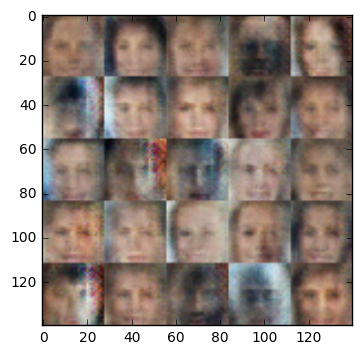

Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 8.5000
Epoch 1/1... Discriminator Loss: 0.0110... Generator Loss: 13.3122
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 13.7691
Epoch 1/1... Discriminator Loss: 0.0037... Generator Loss: 13.4047
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 9.3305
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 13.8671
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 13.8756
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 8.4001
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 12.7299
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 9.1810


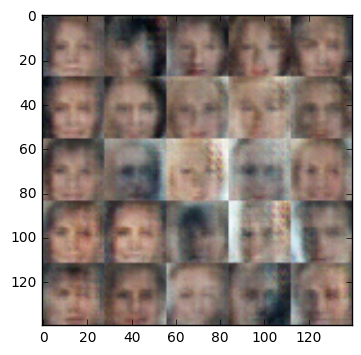

Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 7.6965
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 13.6501
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 11.8856
Epoch 1/1... Discriminator Loss: 0.0203... Generator Loss: 4.5115
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 10.4618
Epoch 1/1... Discriminator Loss: 0.0048... Generator Loss: 7.1840
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 11.4758
Epoch 1/1... Discriminator Loss: 0.0048... Generator Loss: 9.1471
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 11.2160
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 14.5435


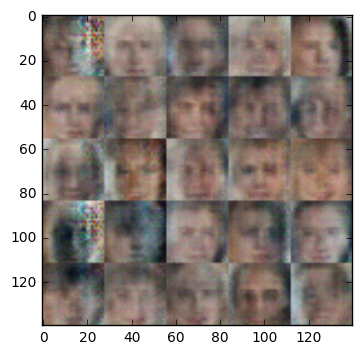

Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 8.4152
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 11.7230
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 9.4254
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 14.5768
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 10.4352
Epoch 1/1... Discriminator Loss: 0.0411... Generator Loss: 3.7723
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 13.6057
Epoch 1/1... Discriminator Loss: 0.0066... Generator Loss: 9.9937
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 12.1059
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 13.5830


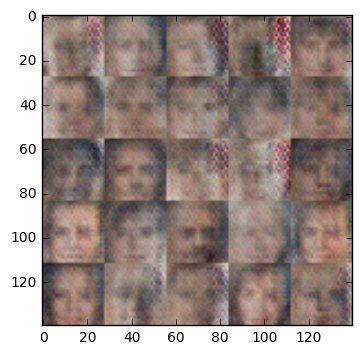

Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 10.6828
Epoch 1/1... Discriminator Loss: 0.0046... Generator Loss: 6.2913
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 10.6914
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 11.3684
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 14.3393
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 11.0355
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 11.2379
Epoch 1/1... Discriminator Loss: 0.0071... Generator Loss: 10.4385
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 15.3168
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 12.8189


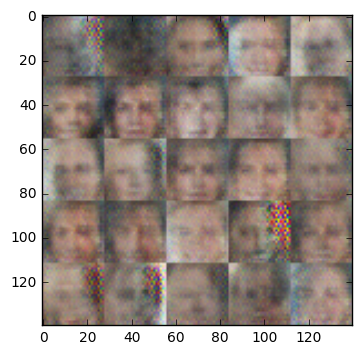

Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 9.9783
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 8.2558
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 16.0307
Epoch 1/1... Discriminator Loss: 0.0061... Generator Loss: 5.7589
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 7.8433
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 10.3872
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 14.6809
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 11.1041
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 11.5807
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 13.9531


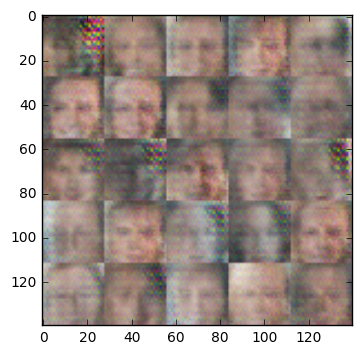

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 13.2323
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 9.7067
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 6.5804
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 9.5666
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 7.0329
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 10.9436
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.9861
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 8.7330
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 12.0197
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 9.6162


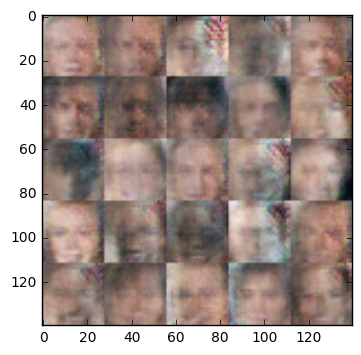

Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 11.2392
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 12.5383
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 8.7349
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 13.9037
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 12.4258
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 11.4405
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 13.7154
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 7.5637
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 14.3136
Epoch 1/1... Discriminator Loss: 0.0051... Generator Loss: 5.8672


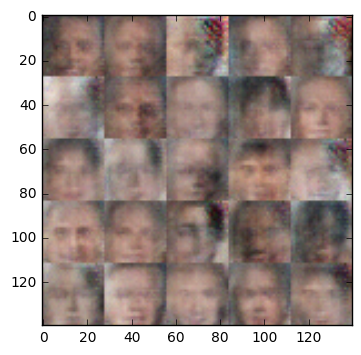

Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 9.3418
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.6373
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 9.9221
Epoch 1/1... Discriminator Loss: 0.1460... Generator Loss: 2.4302
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.7187
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 8.2788
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 10.6011
Epoch 1/1... Discriminator Loss: 0.0052... Generator Loss: 6.2350
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 12.3994
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.7834


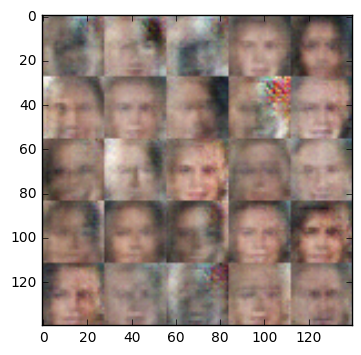

Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 13.0517
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 10.9839
Epoch 1/1... Discriminator Loss: 0.0152... Generator Loss: 4.6440
Epoch 1/1... Discriminator Loss: 0.3911... Generator Loss: 1.5176
Epoch 1/1... Discriminator Loss: 0.0041... Generator Loss: 10.2983
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 10.3004
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 10.0272
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 16.0759
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 8.5715
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 9.6570


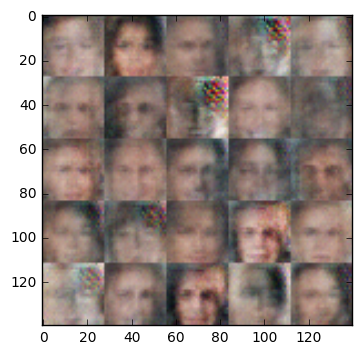

Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 15.7594
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 10.7385
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 11.2627
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 9.2369
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 14.2668
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.2005
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 6.0354
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.7963
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 11.9210
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.5302


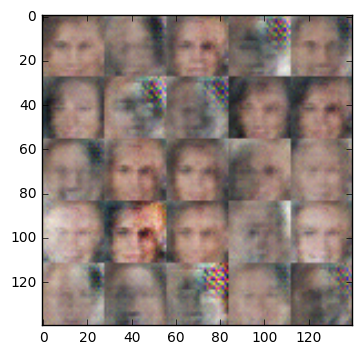

Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 8.1612
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.7044
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 12.6744
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.7989
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 11.4310
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 7.2066
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 9.4812
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 13.3212
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.2607
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 7.9681


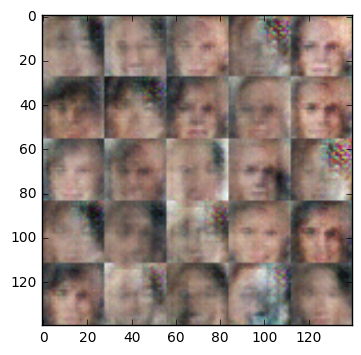

Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 10.2642
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 9.2389
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 14.2231
Epoch 1/1... Discriminator Loss: 0.2707... Generator Loss: 1.8793
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 13.0792
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 8.9716
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 14.9343
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 12.5747
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 8.8063
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 12.8060


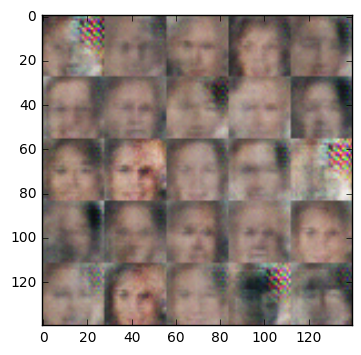

Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 10.8388
Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 6.8805
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.9505
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 15.6144
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 11.0679
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.1955
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 14.8223
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 11.0506
Epoch 1/1... Discriminator Loss: 0.2179... Generator Loss: 2.0406
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 11.6824


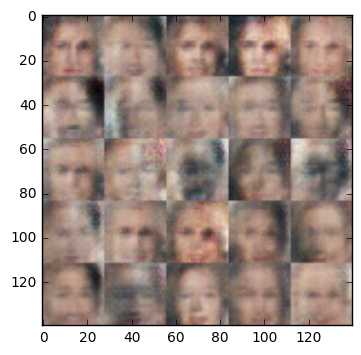

Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 12.9115
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 10.9621
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 12.8082
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 9.7317
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 12.8524
Epoch 1/1... Discriminator Loss: 1.0707... Generator Loss: 0.9140
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 9.3490
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 9.5717
Epoch 1/1... Discriminator Loss: 0.0294... Generator Loss: 10.8357
Epoch 1/1... Discriminator Loss: 0.0187... Generator Loss: 6.9364


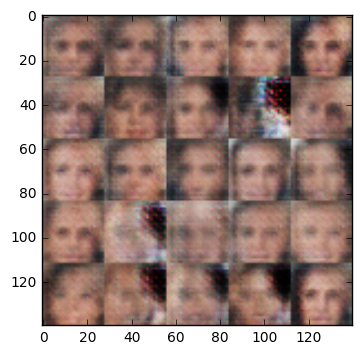

Epoch 1/1... Discriminator Loss: 0.2327... Generator Loss: 3.3053
Epoch 1/1... Discriminator Loss: 0.0444... Generator Loss: 4.2470
Epoch 1/1... Discriminator Loss: 0.0182... Generator Loss: 7.6272
Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 6.2864
Epoch 1/1... Discriminator Loss: 0.1182... Generator Loss: 2.5173
Epoch 1/1... Discriminator Loss: 0.0086... Generator Loss: 6.0421
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 9.2929
Epoch 1/1... Discriminator Loss: 0.0088... Generator Loss: 12.2201
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 12.5234
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.9653


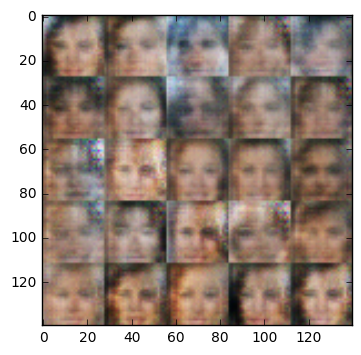

Epoch 1/1... Discriminator Loss: 0.0215... Generator Loss: 14.2481
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 7.0518
Epoch 1/1... Discriminator Loss: 0.0154... Generator Loss: 11.3214
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 7.1437
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 13.1799
Epoch 1/1... Discriminator Loss: 0.0061... Generator Loss: 7.5435
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 13.8095
Epoch 1/1... Discriminator Loss: 0.0163... Generator Loss: 8.6520
Epoch 1/1... Discriminator Loss: 0.0262... Generator Loss: 4.4639
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 9.9860


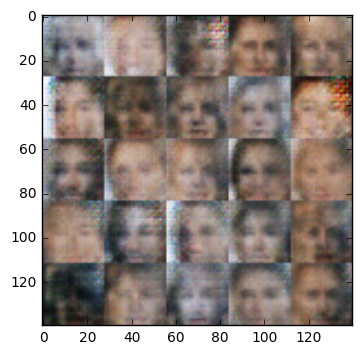

Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 10.0693
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 13.1521
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 8.6510
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 10.8994
Epoch 1/1... Discriminator Loss: 0.0293... Generator Loss: 12.1517
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 8.6273
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 12.5928
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 9.8303
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 11.6121
Epoch 1/1... Discriminator Loss: 0.0041... Generator Loss: 8.0149


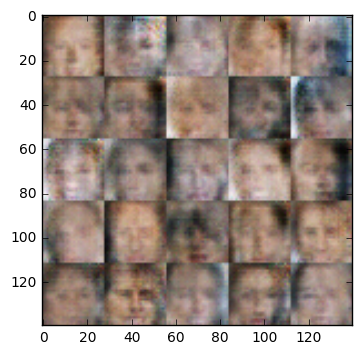

Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 10.5379
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.9785
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 12.3840
Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 7.3019
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 11.0842
Epoch 1/1... Discriminator Loss: 0.0220... Generator Loss: 10.8478
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 9.6869
Epoch 1/1... Discriminator Loss: 0.0202... Generator Loss: 4.3365
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 14.1998
Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 11.4984


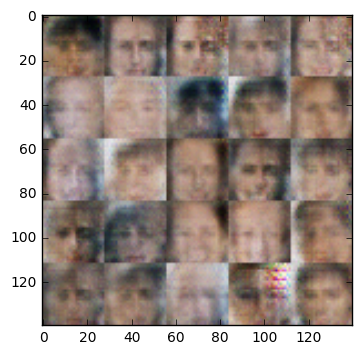

Epoch 1/1... Discriminator Loss: 0.0069... Generator Loss: 5.9926
Epoch 1/1... Discriminator Loss: 0.0767... Generator Loss: 2.8820
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 13.2715
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.6301
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 9.8492
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.6462
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 9.9472
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 17.7439
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 11.5407
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.0352


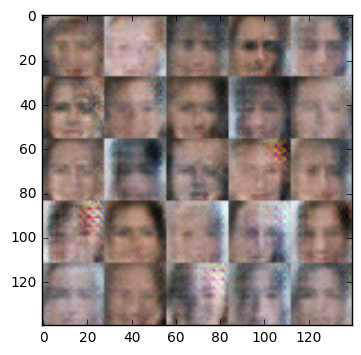

Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 12.9992
Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 8.6967
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.5454
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 13.6350
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.8147
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 11.4190
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.8501
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 5.3394
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.2510
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 10.3964


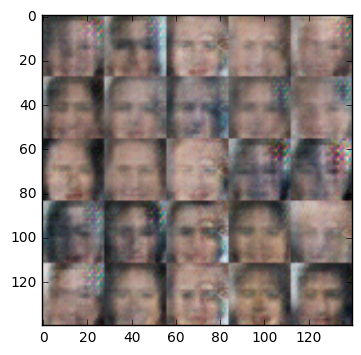

Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 7.2243
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 14.0363
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 10.7962
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 13.3149
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 10.1652
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 11.2083
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 14.0798
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 12.3459
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 11.0487
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 10.3414


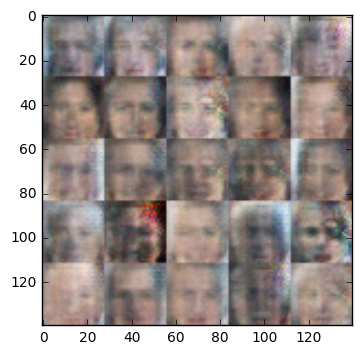

Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 12.4324
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 13.7345
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 9.4750
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.0711
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 10.9153
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.2562
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 7.8444
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.9250
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 14.1731
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 7.5455


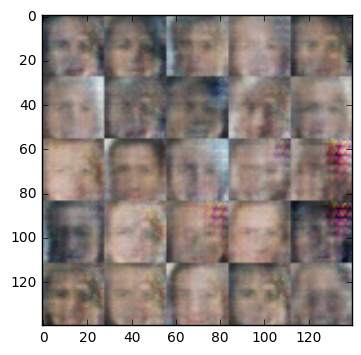

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.5271
Epoch 1/1... Discriminator Loss: 0.0304... Generator Loss: 3.7934
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 7.6610
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 12.4420
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 7.7485
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 8.3874
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.4476
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.2397
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 6.8131
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 8.9499


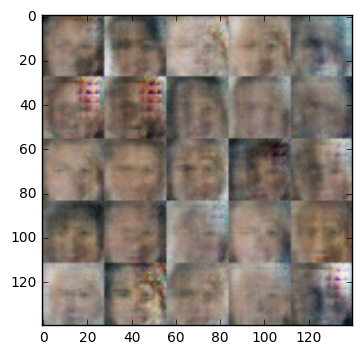

Epoch 1/1... Discriminator Loss: 0.0047... Generator Loss: 6.0228
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.9495
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 8.8511
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 12.6013
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.5345
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.0200
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 12.7550
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 7.6517
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 10.1804
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 11.4153


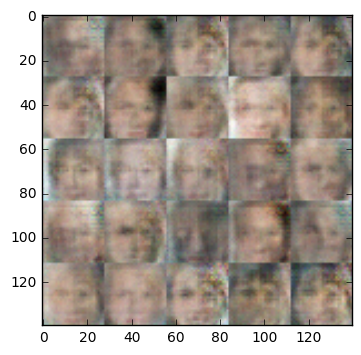

Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 19.7861
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 12.8282
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 11.7756
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 8.8975
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.9252
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.9314
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.1947
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 9.8131
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 16.4514
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 11.6512


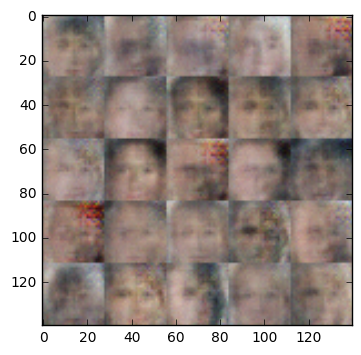

Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 13.5909
Epoch 1/1... Discriminator Loss: 0.0038... Generator Loss: 10.0298
Epoch 1/1... Discriminator Loss: 0.1352... Generator Loss: 14.5675
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 9.4250
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 10.0460
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 11.7399
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 11.7208
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 12.1064
Epoch 1/1... Discriminator Loss: 0.0088... Generator Loss: 5.7513
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 13.4002


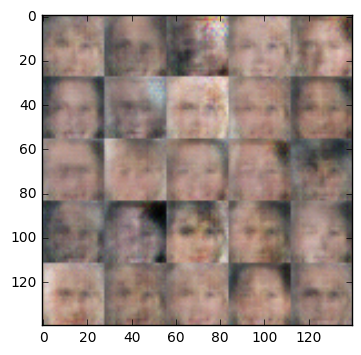

Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 6.7282
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 9.1956
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 12.8018
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 7.2343
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.3724
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 5.5963
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 11.7747
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 8.8557
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 7.3561
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.3046


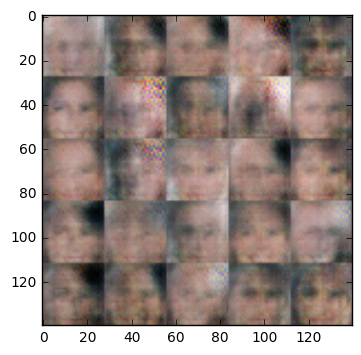

Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 7.2612
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.6021
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 13.0795
Epoch 1/1... Discriminator Loss: 0.0039... Generator Loss: 6.1523
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 14.6747
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 12.1836
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 12.7806
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 10.0932
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 8.2047
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 11.7675


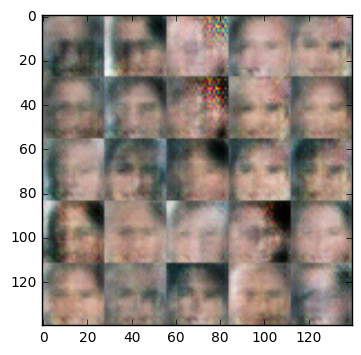

Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.2141
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 5.8123
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 10.9589
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 9.8967
Epoch 1/1... Discriminator Loss: 17.8505... Generator Loss: 24.0400
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 9.8612
Epoch 1/1... Discriminator Loss: 0.0065... Generator Loss: 6.0440
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 5.6201
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 7.4257
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 9.8555


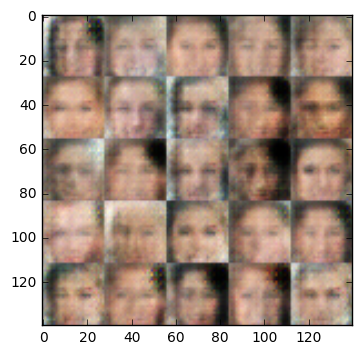

Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 9.5543
Epoch 1/1... Discriminator Loss: 0.2546... Generator Loss: 2.0167
Epoch 1/1... Discriminator Loss: 0.0187... Generator Loss: 5.3247
Epoch 1/1... Discriminator Loss: 0.0114... Generator Loss: 10.3212
Epoch 1/1... Discriminator Loss: 0.0213... Generator Loss: 11.9595
Epoch 1/1... Discriminator Loss: 0.0135... Generator Loss: 5.2131
Epoch 1/1... Discriminator Loss: 0.2634... Generator Loss: 1.8574
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 10.8068
Epoch 1/1... Discriminator Loss: 0.3685... Generator Loss: 1.9811
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.3940


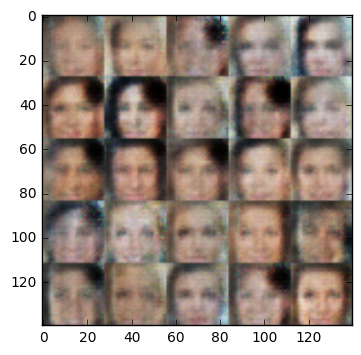

Epoch 1/1... Discriminator Loss: 0.0118... Generator Loss: 5.5898
Epoch 1/1... Discriminator Loss: 0.2978... Generator Loss: 1.7046
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 9.4300
Epoch 1/1... Discriminator Loss: 0.2008... Generator Loss: 1.8543
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 9.5747
Epoch 1/1... Discriminator Loss: 0.0196... Generator Loss: 4.4905
Epoch 1/1... Discriminator Loss: 0.0050... Generator Loss: 12.6713
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 10.5401
Epoch 1/1... Discriminator Loss: 0.0206... Generator Loss: 4.5259
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 11.2230


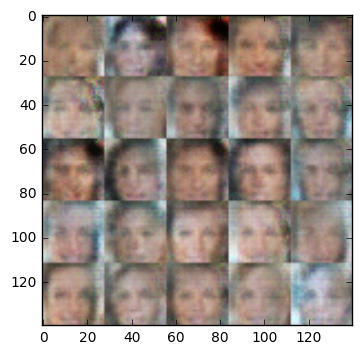

Epoch 1/1... Discriminator Loss: 0.1467... Generator Loss: 14.0117
Epoch 1/1... Discriminator Loss: 0.0095... Generator Loss: 8.0596
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 9.1532
Epoch 1/1... Discriminator Loss: 0.0187... Generator Loss: 4.7452
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 9.7837
Epoch 1/1... Discriminator Loss: 0.0276... Generator Loss: 4.0537
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 7.8213
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 7.6637
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 6.7741
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 8.7484


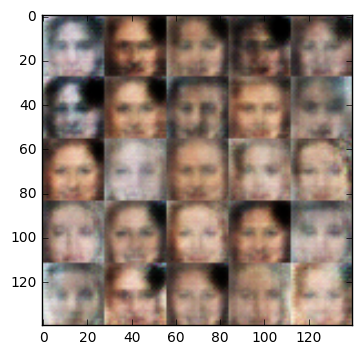

Epoch 1/1... Discriminator Loss: 0.2746... Generator Loss: 1.7284
Epoch 1/1... Discriminator Loss: 0.0137... Generator Loss: 4.8052
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 11.4524
Epoch 1/1... Discriminator Loss: 0.0358... Generator Loss: 3.7664
Epoch 1/1... Discriminator Loss: 0.0048... Generator Loss: 13.2441
Epoch 1/1... Discriminator Loss: 0.0581... Generator Loss: 14.3613
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 12.1940
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 8.8222
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 10.4491
Epoch 1/1... Discriminator Loss: 0.0061... Generator Loss: 6.8434


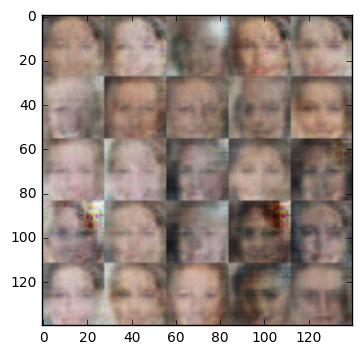

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 10.5293
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 10.6348
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 9.8069
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 13.9422
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 11.9134
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 8.4731
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.1802
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 10.5310
Epoch 1/1... Discriminator Loss: 0.0132... Generator Loss: 8.3343
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 12.5918


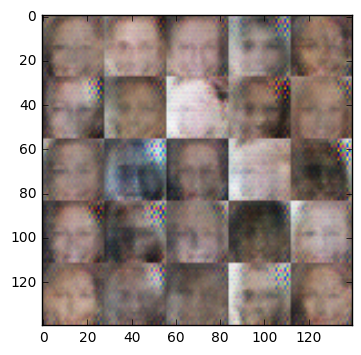

Epoch 1/1... Discriminator Loss: 0.0048... Generator Loss: 11.7249
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 8.5450
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 10.4007
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 11.8698
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.5149
Epoch 1/1... Discriminator Loss: 0.0048... Generator Loss: 6.6665
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 10.7324
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 8.2113
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 12.2472
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.1995


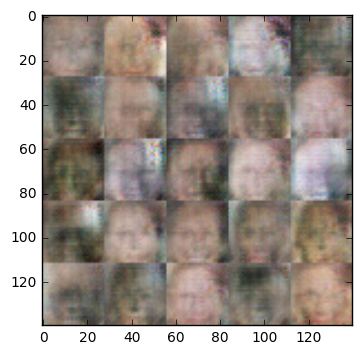

Epoch 1/1... Discriminator Loss: 0.0081... Generator Loss: 9.5027
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 10.7210
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 8.3349


In [92]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.